## **Project 1 : 對ptt憂鬱版進行分析**
第四組 : B094020001 林芳宇、B094020029謝嘉霖、B094020030池品叡、B094020041吳芃儀
### 大綱
1. 資料前處理
2. 中文社會網路分析
3. NER種類分析
4. 基於 NER 的 PTT 憂鬱版網路圖
5. 利用SnowNLP進行情緒分析
6. 分析憂鬱版文章之詞彙關係
7. LDA主題模型
8. GuidedLDA
9. 主題分布的比例
10. LLM主題分析

## 1. 資料前處理

In [101]:
# 載入預訓練集
import pandas as pd
import re
import matplotlib
import matplotlib.pyplot as plt 
import matplotlib.font_manager as fm
from wordcloud import WordCloud 
import jieba
from nltk import ngrams, FreqDist

import numpy as np
from ckiptagger import data_utils, construct_dictionary, WS, POS, NER
import time

In [2]:
# 繪圖相關設定
fprop = fm.FontProperties(fname="/font/SourceHanSansTW-Regular.otf")
FontPath = 'font/SourceHanSansTW-Regular.otf' # 設定字型
matplotlib.rc('font', family='Microsoft JhengHei')

# 設定整份 notebook 圖片的長寬與 dpi
plt.rcParams["figure.figsize"] = [6, 4]
plt.rcParams["figure.dpi"] = 150

# 設定圖的字體大小
plt.rcParams['font.size'] = 10

In [174]:
df = pd.read_csv("data/depression.csv")
df["artDate"] = pd.to_datetime(df["artDate"])
df['artDate'] = df['artDate'].dt.date 
df.head(3)

,system_id,artUrl,artTitle,artDate,artPoster,artCatagory,artContent,artComment,e_ip,insertedDate,dataSource
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,yoshi9145,prozac,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,[],211.20.236.198,2022-04-19 02:07:52,ptt
1,2,https://www.ptt.cc/bbs/prozac/M.1650331853.A.C...,[陰天]自信,2022-04-19,merpheus,prozac,沒自信真是我的致命傷\n\n其實腦中都可以想像自信的樣子要怎麼演\n\n但實際想演的時候就縮...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""doublehelix""...",223.138.127.164,2022-04-20 02:08:46,ptt
2,3,https://www.ptt.cc/bbs/prozac/M.1650344674.A.D...,[陰天]醫生,2022-04-19,epoch3004,prozac,這兩個月跑去大醫院看\n原本以為長效針還有效\n結果還是沒辦法 無感了\n不知道要怎麼辦\n...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""koxinga"", ""c...",61.58.108.146,2022-04-20 02:08:46,ptt


In [4]:
clear_df = df.copy()

#去除本次不會用到的欄位
drop_cols = ['artPoster', 'artCatagory', 'artComment', 'e_ip', 'insertedDate', 'dataSource']
clear_df.drop(drop_cols, axis = 1, inplace = True)

#去除文章內容為空值的筆數
clear_df.dropna(subset = ['artContent'], axis=0, how='any', inplace=True)

#新增['sentence']欄位，用'。'取代'\n\n'，並用'，'取代'\n'
clear_df['sentence'] = clear_df['artContent'].str.replace(r'\n\n','。', regex=True)
clear_df['sentence'] = clear_df['sentence'].str.replace(r'\n','，', regex=True)

#移除內文中的網址
clear_df['sentence'] = clear_df['sentence'].replace(r'http\S+', '', regex=True).replace(r'www\S+', '', regex=True)

clear_df.head(3)

,system_id,artUrl,artTitle,artDate,artContent,sentence
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,今天打疫苗順便問了醫生身體一直存在不舒服的症狀，雖然兩年前檢查過沒診斷出什麼，但是這症狀一直...
1,2,https://www.ptt.cc/bbs/prozac/M.1650331853.A.C...,[陰天]自信,2022-04-19,沒自信真是我的致命傷\n\n其實腦中都可以想像自信的樣子要怎麼演\n\n但實際想演的時候就縮...,沒自信真是我的致命傷。其實腦中都可以想像自信的樣子要怎麼演。但實際想演的時候就縮了。好討厭自...
2,3,https://www.ptt.cc/bbs/prozac/M.1650344674.A.D...,[陰天]醫生,2022-04-19,這兩個月跑去大醫院看\n原本以為長效針還有效\n結果還是沒辦法 無感了\n不知道要怎麼辦\n...,這兩個月跑去大醫院看，原本以為長效針還有效，結果還是沒辦法 無感了，不知道要怎麼辦，都無感了...


In [5]:
# 斷句
clear_df['sentence'] = clear_df['sentence'].str.split("[,，。！!？?]{1,}")

sent_df = clear_df.explode('sentence').reset_index(drop=True)

sent_df.head()

,system_id,artUrl,artTitle,artDate,artContent,sentence
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,今天打疫苗順便問了醫生身體一直存在不舒服的症狀
1,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,雖然兩年前檢查過沒診斷出什麼
2,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,但是這症狀一直存在
3,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,感覺也不是很普通常見的那種
4,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,問了醫生過兩年還需要檢查嗎


In [75]:
# 斷詞
jieba.set_dictionary('dict/dict.txt') #預設辭典

#去除句子中除了字母、數字、空白字符以外的符號
sent_df['sentence'] = sent_df['sentence'].str.replace(r'[^\w\s]+', '', regex=True).astype(str)

# 把長度小於1的sentence刪掉
sent_df = sent_df[sent_df["sentence"].str.len() > 1]

# 使用jieba進行斷詞
word_df = sent_df.assign(word = sent_df['sentence'].apply(jieba.lcut)).explode('word').drop(['sentence'], axis=1)

# 只留下中文字
word_df['word'] = word_df['word'].apply(lambda x: re.sub('[^\u4e00-\u9fff]+', '',x))

#去除少於兩個字的詞語
word_df = word_df.loc[word_df['word'].str.len() > 1]
word_df.head(10)

Building prefix dict from c:\Users\qweji\OneDrive\桌面\2024_winter_practice\SMA2024\SMA_2024S\project\dict\dict.txt ...
Loading model from cache C:\Users\qweji\AppData\Local\Temp\jieba.u1509b53a2e4b51b3d15195eab3fa6037.cache
Loading model cost 0.548 seconds.
Prefix dict has been built successfully.


,system_id,artUrl,artTitle,artDate,artContent,word
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,今天
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,疫苗
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,順便
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,問了
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,醫生
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,身體
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,一直
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,存在
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,舒服
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,症狀


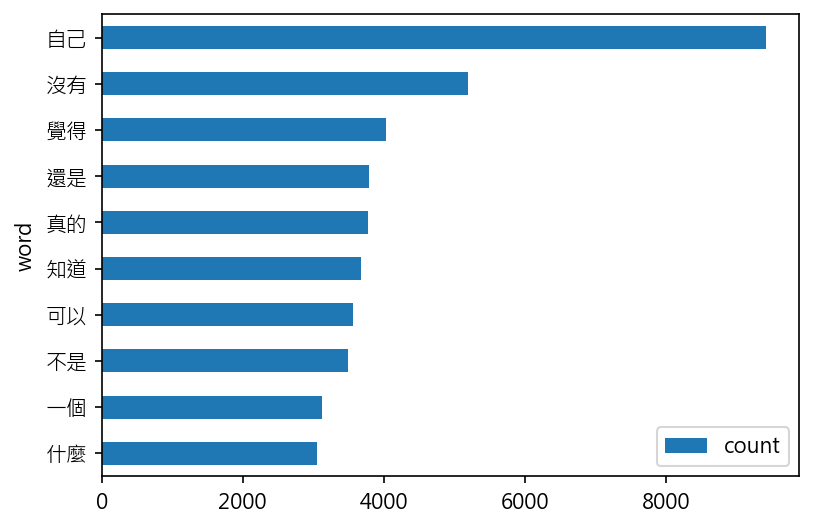

In [15]:
freq_df = pd.DataFrame(pd.value_counts(word_df['word'])).sort_values(by = ['count'], ascending = False).reset_index()
freq_df.head(10).plot.barh(x = 'word', y = 'count').invert_yaxis()

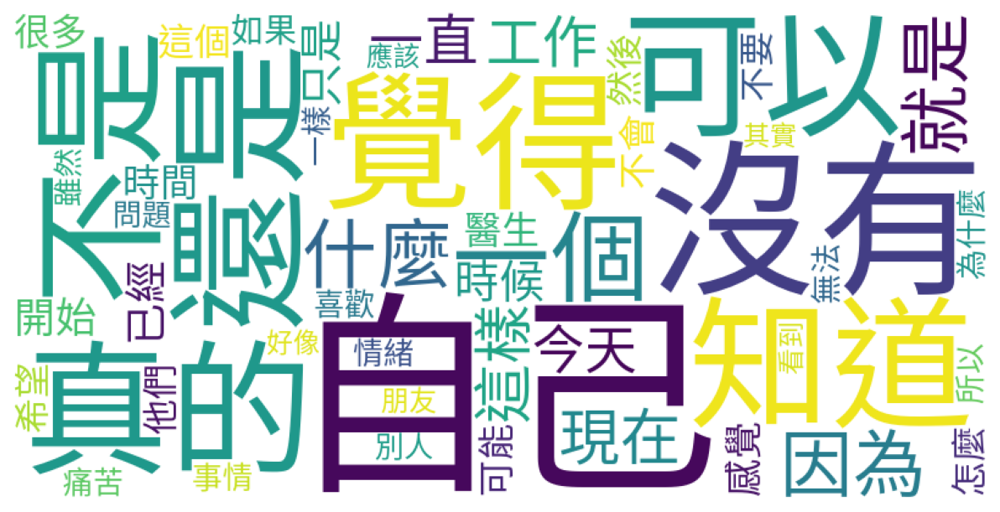

In [16]:
# wordcloud的輸入須為dict，因此先將freq_df轉換成成dict
freq_dict = freq_df.set_index('word').to_dict()
freq_dict = freq_dict['count']

# 繪製文字雲
wordcloud = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud.generate_from_frequencies(freq_dict)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

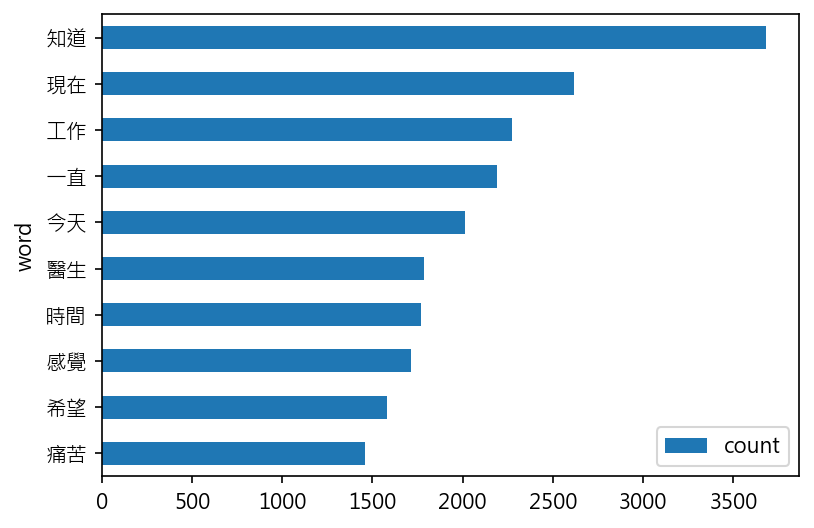

In [17]:
# 移除停用字並繪製長條圖
stopwords = [line.strip() for line in open('dict/old_stopwords.txt', 'r', encoding='utf-8').readlines()] 
noStop_df = word_df[~word_df['word'].isin(stopwords)]
freq_df_nostop = pd.DataFrame(pd.value_counts(noStop_df['word'])).sort_values(by = ['count'], ascending = False).reset_index()
freq_df_nostop.head(10).plot.barh(x = 'word', y = 'count').invert_yaxis()
plt.show()

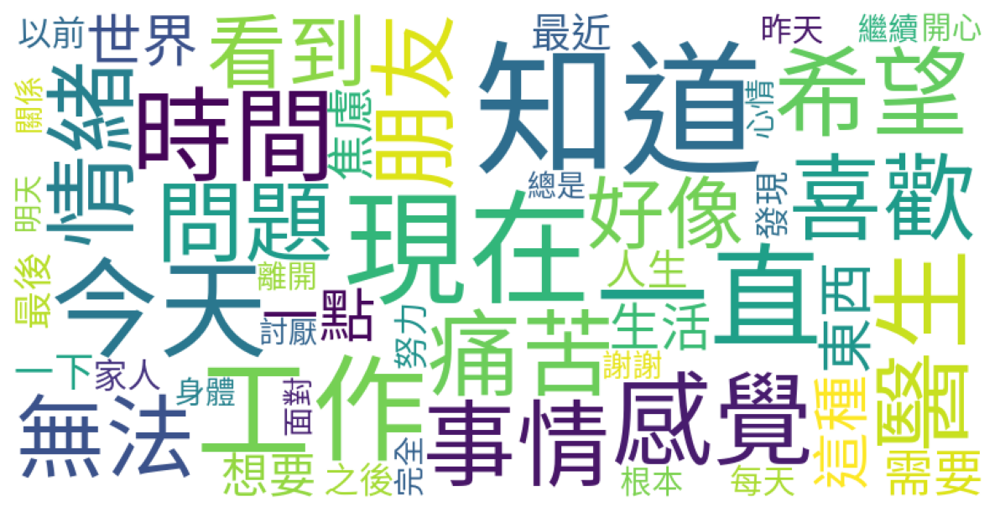

In [18]:
# 移除停用字後再次繪製文字雲
freq_dict_nostop = freq_df_nostop.set_index('word').to_dict()
freq_dict_nostop = freq_dict_nostop['count']

# 繪製文字雲
wordcloud_nostop = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud_nostop.generate_from_frequencies(freq_dict_nostop)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud_nostop)
plt.axis('off')
plt.show()

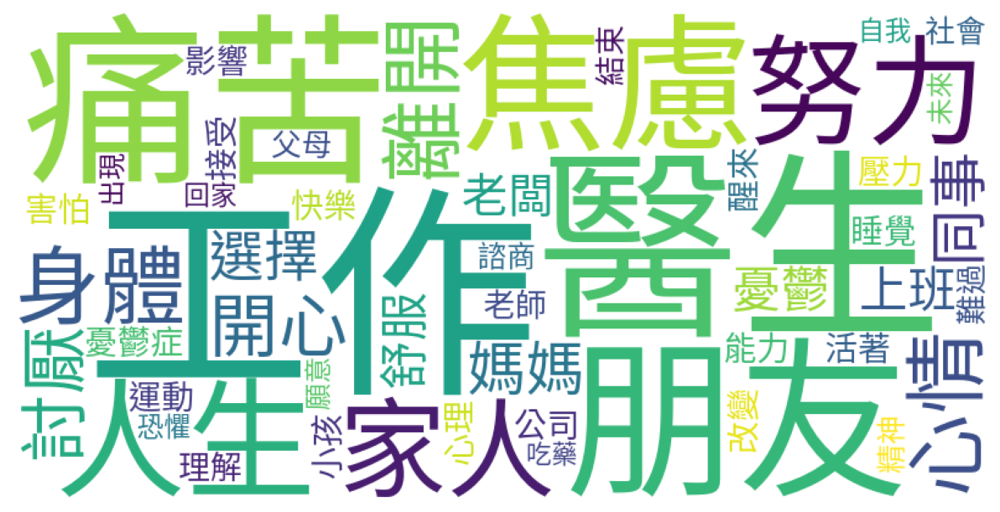

In [19]:
# 反覆繪製文字雲查看、更新停用字典
# 參數形式手動加入停用字
stopwords_manual = ["知道", "現在", "根本", "好像", "東西", "需要", "昨天", "明天", "一直", "想要", "總是", "今天", "感覺", "容易", 
                    "最近", "一下", "每天", "一點", "好了", "繼續", "之後", "希望", "時間", "這種", "一天", "完全", "突然", "發現",
                    "也許", "想到", "事情", "一次", "最後", "看到", "以前", "喜歡", "至少", "狀況", "不用", "早上", "台灣", "不想",
                    "那種", "太多", "謝謝", "感到", "晚上", "一種", "方式", "狀態", "剛剛", "問題", "無法", "地方", "發生", "明明",
                    "沒辦法", "關係", "每個", "過去", "兩個", "重要", "想法", "世界", "面對", "變成", "特別", "直接", "相信", "能夠",
                    "終於", "生活", "遇到", "正常", "永遠", "下去", "情緒", "曾經", "本來"]
stopwords.extend(stopwords_manual)

noStop_df = noStop_df[~noStop_df['word'].isin(stopwords)]
freq_df_nostop = pd.DataFrame(pd.value_counts(noStop_df['word'])).sort_values(by = ['count'], ascending = False).reset_index()

# 再次繪製文字雲
freq_dict_nostop = freq_df_nostop.set_index('word').to_dict()
freq_dict_nostop = freq_dict_nostop['count']

wordcloud_nostop = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud_nostop.generate_from_frequencies(freq_dict_nostop)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud_nostop)
plt.axis('off')
plt.show()

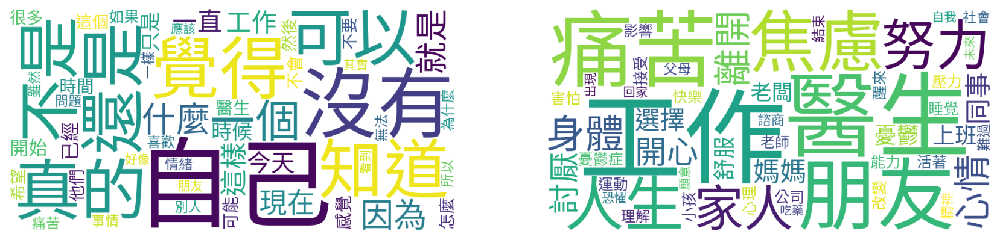

In [20]:
#比較清理前後的文字雲
plt.figure(figsize = (14,8))

plt.subplot(1,2,1)
plt.imshow(wordcloud)
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(wordcloud_nostop)
plt.axis('off')

plt.show()

## 2. 中文社群網路分析

### 發文者與留言者關係

取得留言者跟狀態(推)

In [ ]:
# parse comment
# 處理某篇文章的所有留言（取出留言者與狀態）
def getComtInfo(com):
  cmters,cmt_statuss = [],[]
  com = eval(com)
  for i in com:
    # print(i)
    cmters.append(i['cmtPoster'])
    cmt_statuss.append(i['cmtStatus'])
  return pd.Series([cmters, cmt_statuss])

raw_data[['artComter','artStatus']] = raw_data['artComment'].apply(lambda r: getComtInfo(r))
raw_data.head()

,system_id,artUrl,artTitle,artDate,artPoster,artCatagory,artContent,artComment,e_ip,insertedDate,dataSource,artComter,artStatus
4347,4348,https://www.ptt.cc/bbs/prozac/M.1687085306.A.A...,[陰天],2023-06-18 18:48:24,superfreeman,prozac,今天又做了一些調整，把重要科目移到上午和晚上，投報率較低的移到下午，沒想到有明顯感受到差異，...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""qaz996659"", ...",114.27.206.149,2023-06-19 02:07:30,ptt,"[qaz996659, timer000, superfreeman]","[→, 推, →]"
6044,6045,https://www.ptt.cc/bbs/prozac/M.1702530335.A.8...,[陰天]我好累又好爛（雷,2023-12-14 13:05:31,cien881021,prozac,昨天在圓山公園哭了一個小時\n還想著乾脆人間蒸發算了\n\n明明升上正職，論文也終於完成要畢...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""timer000"", ""...",223.137.57.231,2023-12-15 02:19:21,ptt,"[timer000, timer000, timer000, timer000, timer...","[推, →, →, →, →, 推, →, 推, →, 推, →]"
1658,1659,https://www.ptt.cc/bbs/prozac/M.1663197814.A.8...,[閒聊]失眠(七十六)幻覺,2022-09-15 07:23:32,littlewren,prozac,偶爾會有睡前幻覺、醒前幻覺的經驗(\n#1VAHqwpm\n)，\n\n通常睡前的比較多中性...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""qien"", ""cmtC...",223.140.62.26,2022-09-16 02:00:40,ptt,"[qien, qien, miminiania, Suzy224, Suzy224, bal...","[推, →, 推, 推, →, 推]"
7082,7083,https://www.ptt.cc/bbs/prozac/M.1710497869.A.0...,[閒聊]今天走45min32sec想跟忍者大師說,2024-03-15 18:17:45,kazusn,prozac,其實我跟我哥並不好 他大我八歲 小時候常常打我 是打的很兇的那種\n\n我原諒他差不多是在四...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""isaki1987"", ...",114.26.205.222,2024-03-16 02:24:04,ptt,"[isaki1987, kazusn]","[推, →]"
6130,6131,https://www.ptt.cc/bbs/prozac/M.1703305070.A.9...,[閒聊]記事,2023-12-23 12:17:48,hesione,prozac,一放假就生病\n@&#*^…\n來勢洶洶什麼藥都壓不下去\n一直燒\n脖子背超級痠痛\n看來...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""isaki1987"", ...",184.153.120.32,2023-12-24 02:12:25,ptt,"[isaki1987, tmac012004, qaz996659, qien, isaki...","[推, 推, →, 推, 推, 推, 推, →, 推, 推]"


In [ ]:
raw_data = raw_data.explode(['artComter','artStatus'])
socail_data = raw_data[['artUrl','artPoster','artComter','artStatus']]
socail_data.head(10)

,artUrl,artPoster,artComter,artStatus
4347,https://www.ptt.cc/bbs/prozac/M.1687085306.A.A...,superfreeman,qaz996659,→
4347,https://www.ptt.cc/bbs/prozac/M.1687085306.A.A...,superfreeman,timer000,推
4347,https://www.ptt.cc/bbs/prozac/M.1687085306.A.A...,superfreeman,superfreeman,→
6044,https://www.ptt.cc/bbs/prozac/M.1702530335.A.8...,cien881021,timer000,推
6044,https://www.ptt.cc/bbs/prozac/M.1702530335.A.8...,cien881021,timer000,→
6044,https://www.ptt.cc/bbs/prozac/M.1702530335.A.8...,cien881021,timer000,→
6044,https://www.ptt.cc/bbs/prozac/M.1702530335.A.8...,cien881021,timer000,→
6044,https://www.ptt.cc/bbs/prozac/M.1702530335.A.8...,cien881021,timer000,→
6044,https://www.ptt.cc/bbs/prozac/M.1702530335.A.8...,cien881021,addrying,推
6044,https://www.ptt.cc/bbs/prozac/M.1702530335.A.8...,cien881021,addrying,→


In [ ]:
socail_data.artStatus.unique()
# 可以看出憂鬱版是一個和諧的版面，彼此是互相支持的，沒有'噓'的行為發生

array(['→', '推'], dtype=object)

建立邊的資料

In [ ]:
import random

# 發文者對文章
po_df = socail_data[['artPoster','artUrl']].drop_duplicates().rename(columns = {'artPoster':'src','artUrl':'dis'})

# sample 300 篇文章
random.seed(2024)
sample_url = random.choices(po_df.dis.unique().tolist(),k=300)
po_df = po_df[po_df.dis.isin(sample_url)]

# 留言者對文章，狀態為 weight
re_df = socail_data[['artComter','artUrl','artStatus']].rename(columns = {'artComter':'src','artUrl':'dis','artStatus':'weight'})
re_df = re_df[re_df.dis.isin(sample_url)]
re_df = re_df[~re_df['src'].isna()]
re_df.head()

,src,dis,weight
4347,qaz996659,https://www.ptt.cc/bbs/prozac/M.1687085306.A.A...,→
4347,timer000,https://www.ptt.cc/bbs/prozac/M.1687085306.A.A...,推
4347,superfreeman,https://www.ptt.cc/bbs/prozac/M.1687085306.A.A...,→
7170,bnbexp23ef1,https://www.ptt.cc/bbs/prozac/M.1711170631.A.2...,推
7170,bnbexp23ef1,https://www.ptt.cc/bbs/prozac/M.1711170631.A.2...,→


計算某留言者對文章的總評論分數
- 轉換邊的狀態 -> weight

In [ ]:
def convertStatus(s):
  if s == '推':
    return 2
  elif s == '→':
    return 1
  else :
    return -1
re_df['weight'] = re_df['weight'].map(convertStatus)
# 計算某位留言者對某篇文章的總分數
re_df = re_df.groupby(['src','dis']).sum().reset_index()
re_df

,src,dis,weight
0,Austin1102,https://www.ptt.cc/bbs/prozac/M.1696330052.A.4...,3
1,Austin1102,https://www.ptt.cc/bbs/prozac/M.1706617839.A.8...,6
2,Austin1102,https://www.ptt.cc/bbs/prozac/M.1707859018.A.C...,2
3,BeMessi,https://www.ptt.cc/bbs/prozac/M.1710000651.A.A...,3
4,Belieeve,https://www.ptt.cc/bbs/prozac/M.1658462639.A.8...,2
...,...,...,...
793,yukilala,https://www.ptt.cc/bbs/prozac/M.1707859018.A.C...,2
794,yukilala,https://www.ptt.cc/bbs/prozac/M.1708386993.A.9...,1
795,yukilala,https://www.ptt.cc/bbs/prozac/M.1711197152.A.C...,2
796,zz3000,https://www.ptt.cc/bbs/prozac/M.1672279945.A.9...,2


In [ ]:
# 設定分數低的為紅色
def getColor(w):
  if w>0:
    return 'green'
  else:
    return 'red'
re_df['color'] = re_df.weight.map(getColor)
re_df

,src,dis,weight,color
0,Austin1102,https://www.ptt.cc/bbs/prozac/M.1696330052.A.4...,3,green
1,Austin1102,https://www.ptt.cc/bbs/prozac/M.1706617839.A.8...,6,green
2,Austin1102,https://www.ptt.cc/bbs/prozac/M.1707859018.A.C...,2,green
3,BeMessi,https://www.ptt.cc/bbs/prozac/M.1710000651.A.A...,3,green
4,Belieeve,https://www.ptt.cc/bbs/prozac/M.1658462639.A.8...,2,green
...,...,...,...,...
793,yukilala,https://www.ptt.cc/bbs/prozac/M.1707859018.A.C...,2,green
794,yukilala,https://www.ptt.cc/bbs/prozac/M.1708386993.A.9...,1,green
795,yukilala,https://www.ptt.cc/bbs/prozac/M.1711197152.A.C...,2,green
796,zz3000,https://www.ptt.cc/bbs/prozac/M.1672279945.A.9...,2,green


製作網路圖

In [ ]:
# 人為綠色節點
# po文為橘色節點

# 建立一個網路圖
netWork = pyvis.network.Network(notebook=True, cdn_resources='in_line',directed=True)
# 所有發文者＋留言者
person = list(set(po_df.src.unique().tolist()+re_df.src.unique().tolist()))
url = po_df.dis.unique().tolist()

# 加入節點（人）
netWork.add_nodes(
    nodes = person,
    value = [1 for i in range(len(person))],
    color = ['#66CDAA' for i in range(len(person))],
    title = person
)
# 加入節點（文章）
netWork.add_nodes(
    nodes = url,
    value = [2 for i in range(len(url))],
    color = ['#FFB366' for i in range(len(url))],
    title = url
)

# 加入邊（發文者 -> 文章）
for i in po_df.to_numpy():
  netWork.add_edge(i[0],i[1],width = 2,color='grey')
# 加入邊（留言者 -> 文章），顏色為某發文者對該文章的總分（>0:綠; <=0:紅）
for i in re_df.to_numpy():
  netWork.add_edge(i[0],i[1],width = 2,color=i[3])

# 設定layout，圖節點之間的斥力
netWork.repulsion()

# netWork.show("./basic_netWork.html")
netWork.save_graph("./basic_netWork.html")
IPython.display.HTML('basic_netWork.html')

可以看出用戶都主要圍繞在某些貼文做分享。

### 網友之間的關係

In [ ]:
pos_cmt = socail_data.copy()
pos_cmt = pos_cmt[~pos_cmt.artComter.isna()]
pos_cmt.head(10)

,artUrl,artPoster,artComter,artStatus
4347,https://www.ptt.cc/bbs/prozac/M.1687085306.A.A...,superfreeman,qaz996659,→
4347,https://www.ptt.cc/bbs/prozac/M.1687085306.A.A...,superfreeman,timer000,推
4347,https://www.ptt.cc/bbs/prozac/M.1687085306.A.A...,superfreeman,superfreeman,→
6044,https://www.ptt.cc/bbs/prozac/M.1702530335.A.8...,cien881021,timer000,推
6044,https://www.ptt.cc/bbs/prozac/M.1702530335.A.8...,cien881021,timer000,→
6044,https://www.ptt.cc/bbs/prozac/M.1702530335.A.8...,cien881021,timer000,→
6044,https://www.ptt.cc/bbs/prozac/M.1702530335.A.8...,cien881021,timer000,→
6044,https://www.ptt.cc/bbs/prozac/M.1702530335.A.8...,cien881021,timer000,→
6044,https://www.ptt.cc/bbs/prozac/M.1702530335.A.8...,cien881021,addrying,推
6044,https://www.ptt.cc/bbs/prozac/M.1702530335.A.8...,cien881021,addrying,→


In [ ]:
pos_cmt['score'] = pos_cmt['artStatus'].apply(lambda r: convertStatus(r))

# 某留言者對某發文者的總分
pos_cmt = pos_cmt.groupby(['artComter','artPoster']).sum('score').reset_index()
pos_cmt = pos_cmt[pos_cmt.score>=0]
pos_cmt = pos_cmt[pos_cmt.artComter != pos_cmt.artPoster]
# pos_cmt.score = 1
pos_cmt

,artComter,artPoster,score
0,AreLies,notfound0506,2
1,AreLies,whitepoodle,1
3,Austin1102,ProfessUX,8
4,Austin1102,badshrimp,2
5,Austin1102,gagagaga,2
...,...,...,...
2046,zz3000,notfound0506,4
2047,zz3000,pillow01,2
2048,zz3000,qaz996659,2
2049,zz3000,ui5550,3


In [ ]:
mat = pd.pivot_table(pos_cmt,index = 'artComter', columns = 'artPoster' ,values='score').fillna(0)
mat

artPoster,Abysslol,AreLies,Auld1228,Austin1102,Belieeve,Busufu,CSimon,Cecilia0905,Curiousecret,DickGrayson,...,yahyah,yaliieah,yamap82101,yeeee898,yoshi9145,yuki1037,yukilala,yuri99,z881331,zhickun
artComter,,,,,,,,,,,,,,,,,,,,,
AreLies,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Austin1102,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
BeMessi,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Belieeve,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CBosh,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
yukilala,0.0,0.0,6.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
yule1224,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
zshyGREEN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


- mat: 有方向性，A -> B 分數與 B -> A 分數不一定一樣。
- mat_s: 無方向性（互動總分），A -> B 分數 +  B -> A 分數

In [ ]:
# 所有留言者與發文者
pers = np.unique(pos_cmt[['artComter', 'artPoster']])

# 建立評分矩陣（留言者對發文者分數）
# 取得所有人對於其他人的分數（有方向性）
# 矩陣中的值 mat[i][j] 代表使用者 pers[i]（留言者）對使用者 pers[j]（發文者）的評分，
    # 留言者和發文者之間的關係是有方向的（即，mat[i][j] 不一定等於 mat[j][i]）
mat = pd.pivot_table(pos_cmt,index = 'artComter', columns = 'artPoster' ,values='score' ).fillna(0)\
  .reindex(columns=pers, index=pers, fill_value=0).to_numpy()
print(mat.shape)

# 取得所有人與其他人互動分數總和（無方向，兩個方向分數相加）
# 矩陣中的每一對元素都對稱，即 mat_s[i][j] 等於 mat_s[j][i]
# 對稱矩陣中的值 mat_s[i][j] 表示使用者 pers[i] 與使用者 pers[j] 之間的互動總分。
    # 透過將 pers[i] 對 pers[j] 的評分和 pers[j] 對 pers[i] 的評分相加而得到的。
# np.tril(mat, -1): 生成一個下三角矩陣（包括主對角線下方的所有元素，但不包括主對角線上的元素）
# np.triu(mat, 1): 生成一個上三角矩陣（包括主對角線上方的所有元素，但不包括主對角線上的元素）
tri = (np.tril(mat,-1).T + np.triu(mat,1))
mat_s = tri+tri.T # 上三角和下三角都包括在內，但對角線是 0
mat_s


(475, 475)


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

matPresentGraph()：用來將矩陣轉換為視覺化的網絡圖
- 利用 pyvis 來繪製網絡圖，並設定節點和邊的顏色。

In [ ]:
# 產生隨機的顏色，畫圖使用
def random_color():
  r = lambda: random.randint(0,255)
  return '#%02X%02X%02X' % (r(),r(),r())

def matPresentGraph(mat:np.array, node_id:list, node_type:list=None, node_value:list=None, directed=True, edge_color=None) -> pyvis.network.Network:
  # 有方向或無方向
  if directed != True:
    # 矩陣對稱
    if (mat == mat.transpose()).all():
      print('matrix is Symmetric')
    # 矩陣不對稱
    else:
      print('matrix is not Symmetric')

  # 設定節點的類別及顏色
  # 沒有分節點類別
  if node_type == None:
    c = random_color()
    node_colors = [c for i in range(len(node_id))]
    node_type = [" " for i in range(len(node_id))]
  # 有分節點類別
  else:
    node_color_map = {}
    for i in set(node_type):
      # 幫每個類別產生一個顏色
      while True:
        c = random_color()
        if c not in node_color_map.values():
          break
      node_color_map[i] = c
    node_colors = [node_color_map[i] for i in node_type]
  # print(node_colors)

  # 如果沒有給邊的顏色，隨機產生一個
  if edge_color == None:
    edge_color = random_color()

  # 如果沒有給 node 值，就都分配 1
  if node_value == None:
    node_value = [1 for i in range(len(node_id))]

  # 建立圖
  net = pyvis.network.Network(notebook=True, directed = directed, cdn_resources='in_line')

  titles_list = []
  for i ,j in zip(node_id,node_type):
    titles_list.append(str(i)+":"+str(j))

  net.add_nodes(
      nodes = node_id,
      value = node_value,
      label = node_id,
      title = titles_list,
      color = node_colors
  )

  for row in range(len(node_id)):
    for col in range(len(node_id)):
      if mat[row][col]>0.:
        net.add_edge(
            node_id[row],node_id[col],width = mat[row][col],color = edge_color,title = mat[row][col]
        )
  net.repulsion()
  return net


設定網友的節點類型（同時為發文、留言者 / 發文者 / 留言者）

In [ ]:
# 定義發文者（po）、評論者(cmt)、兩者兼具(both)
node_type = []

cmt_list = pos_cmt['artComter'].unique().tolist()
po_list = pos_cmt['artPoster'].unique().tolist()
both_list = list(set(cmt_list) & set(po_list))
for p in pers:
  if p in both_list:
    node_type.append('both')

  elif p in cmt_list:
    node_type.append('cmt')

  elif p in po_list:
    node_type.append('po')


In [ ]:
net = matPresentGraph(mat=mat, node_id=pers, node_type=node_type)
net.save_graph("./pers_netWork.html")
IPython.display.HTML('pers_netWork.html')

大部分的節點都圍繞在both附近。

### Measures on node
- 目的：找出影響力大的節點（人）
- 方法：
    1. Eigenvector
    2. PageRank
    3. Hitss Score
    4. betweenness centrality

#### 計算 eigenvector centrality （無向圖）
- 概念：與你連接的人越重要，你也越重要(有影響力)
- 連到的節點重要性較高，也會貢獻較大的重要性

特徵向量中心性是一種衡量節點在網絡中重要性的方法，它基於連接節點的重要性計算每個節點的中心性值。經過歸一化處理後，這些中心性值可以更方便地進行比較和可視化。

In [ ]:
# nx.Graph(mat_s): 將對稱矩陣 mat_s 轉換為 NetworkX 的無向圖對象
# nx.eigenvector_centrality: 計算圖中每個節點的特徵向量中心性
# max_iter=10000: 演算法的最大迭代次數，以確保演算法收斂。 特徵向量中心性的計算是一個迭代過程，可能需要多次迭代才能達到穩定狀態。
eigenvec = np.array(list(nx.eigenvector_centrality(nx.Graph(mat_s),max_iter = 10000).values()))

# 將特徵向量中心性值歸一化到 [0, 1] 範圍內
eigenvec = (eigenvec-np.min(eigenvec))/(np.max(eigenvec)-np.min(eigenvec))

In [ ]:
q = np.quantile(eigenvec,[.2,.4,.6,.8])
q

array([0.01304264, 0.02508246, 0.05912364, 0.13857354])

In [ ]:
node_value = []


for i in eigenvec:
  # 越重要分數越高
  if i > q[3]:
    node_value.append(25)
  elif i >q[2]:
    node_value.append(20)
  elif i>q[1]:
    node_value.append(15)
  elif i>q[0]:
    node_value.append(10)
  else:
    node_value.append(5)
net = matPresentGraph(mat = mat_s,node_id = pers,node_type = node_type,node_value = node_value,directed=False)
net.save_graph("./pers_eig_netWork.html")
IPython.display.HTML('pers_eig_netWork.html')

matrix is Symmetric


可以發現有評論的文章且同時有多人評論的用戶，重要程度愈高（節點越大）

#### PageRank (有向圖)
- 在一個有向圖中，PageRank 值高的節點通常是那些被很多其他節點連結到的節點，或是被一些重要節點連結到的節點

In [ ]:
# Digraph 設定有向圖
# nx.DiGraph(mat): 使用 NetworkX 的 DiGraph 類別將矩陣 mat 轉換為有向圖物件。
# nx.pagerank(): 計算圖中每個節點的 PageRank 值
pagerank = np.array(list(nx.pagerank(nx.DiGraph(mat)).values()))
# pagerank = (pagerank-np.min(pagerank))/(np.max(pagerank)-np.min(pagerank))
pagerank

array([0.00088563, 0.00081876, 0.00308197, 0.00666875, 0.00071494,
       0.0010156 , 0.00073281, 0.00071494, 0.00227439, 0.00081716,
       0.00071494, 0.00092813, 0.00071494, 0.00071494, 0.00075115,
       0.00071494, 0.00071494, 0.00071494, 0.00071494, 0.00071494,
       0.00071494, 0.00072772, 0.00071494, 0.00071494, 0.0007559 ,
       0.00071494, 0.00071494, 0.00080175, 0.00077907, 0.00071494,
       0.00071494, 0.00074966, 0.00071494, 0.00149307, 0.00071494,
       0.0018731 , 0.00095604, 0.00300899, 0.00071494, 0.00071494,
       0.00205785, 0.00096371, 0.00071494, 0.00071494, 0.00071494,
       0.00071494, 0.0019362 , 0.00132263, 0.00178508, 0.00071494,
       0.04945778, 0.00071494, 0.00071494, 0.00071494, 0.00071494,
       0.0110436 , 0.00236217, 0.00082981, 0.00177155, 0.00071494,
       0.00071494, 0.00071494, 0.00071494, 0.00071494, 0.00071494,
       0.00071494, 0.01538498, 0.0011978 , 0.00071494, 0.00071494,
       0.00409063, 0.00071494, 0.00071494, 0.00071494, 0.00086

In [ ]:
net = matPresentGraph(mat = mat,node_id = pers,node_type = node_type,node_value=(pagerank*1000).tolist())
net.save_graph("./pers_page_netWork.html")
IPython.display.HTML('pers_page_netWork.html')

可以看出indegree較多，重要程度愈高(而那些節點也通常是both)

#### Hits score （有向圖）
- 網頁重要性指標
    - index page (索引網頁，可以連結到其他網頁)：Hub Score 越高代表連到的 content page 都是 high authority score
    - content page (內容網頁)：authority score 越高代表越多 high hub score 的 index page 指向他

In [ ]:
# nx.hits 計算圖中每個節點的 Hub 和 Authority 值。 HITS 演算法將每個節點分為兩種角色：
    # Hub： 一個好的 Hub 節點連結到許多 Authority 節點。
    # Authority： 一個好的 Authority 節點被許多 Hub 節點連結到。

# out_：每個節點的 Hub 值。
# in_：每個節點的 Authority 值。

out_,in_ = nx.hits(nx.DiGraph(mat),max_iter=100)

In [ ]:
out_ = np.array(list(out_.values()))
out_q = np.quantile(out_,[.2,.4,.6,.8])
out_q

array([-0.00000000e+00,  2.26569663e-05,  1.22730459e-04,  6.45971817e-04])

In [ ]:
in_ = np.array(list(in_.values()))
in_q = np.quantile(in_,[.2,.4,.6,.8])
in_q

array([-6.23366811e-20,  5.51327403e-19,  9.16981800e-05,  1.49502180e-03])

In [ ]:
node_value = []

# 根據 Hub 值設定節點大小
for i in out_:
  if i > out_q[3]:
    node_value.append(25)
  elif i >out_q[2]:
    node_value.append(20)
  elif i>out_q[1]:
    node_value.append(15)
  elif i>out_q[0]:
    node_value.append(10)
  else:
    node_value.append(5)

net = matPresentGraph(mat = mat,node_id = pers,node_type = node_type,node_value=node_value)
net.save_graph("./pers_out_netWork.html")
IPython.display.HTML('pers_out_netWork.html')

可以發現連結到越重要的發文者（許多人也同時對他評論），自己也越重要</br>
(cmt和both的節點相對大)

In [ ]:
node_value = []

# 根據 Authority 值設定節點大小
for i in in_:
  if i > in_q[3]:
    node_value.append(25)
  elif i >in_q[2]:
    node_value.append(20)
  elif i>in_q[1]:
    node_value.append(15)
  elif i>in_q[0]:
    node_value.append(10)
  else:
    node_value.append(5)

net = matPresentGraph(mat = mat,node_id = pers,node_type = node_type,node_value=node_value)
net.save_graph("./pers_in_netWork.html")
IPython.display.HTML('pers_in_netWork.html')

可以發現 indegree 的多寡會決定其重要程度

#### betweenness centrality
- 中介中心性: 成為任兩節點之間的最短路徑次數
- 概念：連結到越多社群網路的節點，重要性越高

<img src="https://dist.neo4j.com/wp-content/uploads/20190201101243/betweenness-centrality-visualization-7.jpg" width="35%">

In [ ]:
bet = np.array(list(nx.betweenness_centrality(nx.Graph(mat_s)).values()))
bet = (bet-np.min(bet))/(np.max(bet)-np.min(bet))
bet_q = np.quantile(bet,[.2,.4,.6,.8])

In [ ]:
node_value = []
for i in bet:
  if i > bet_q[3]:
    node_value.append(25)
  elif i > bet_q[2]:
    node_value.append(20)
  elif i>bet_q[1]:
    node_value.append(15)
  elif i>bet_q[0]:
    node_value.append(10)
  else:
    node_value.append(5)

net = matPresentGraph(mat = mat_s,node_id = pers,node_type = node_type,node_value=node_value ,directed=False)
net.save_graph("./pers_bet_netWork.html")
IPython.display.HTML('pers_bet_netWork.html')

matrix is Symmetric


可以看到與多個社群相連的人，越重要(通常此用戶的身分是both和po)


#### Measures on graph

Transitivity/Density/Distance/Diameter/Clustering

計算最大的subgraph 的 measure

In [ ]:
# 計算max subgraph
G = nx.Graph(mat_s)
G_sub = sorted(nx.connected_components(G), key=len, reverse=True)
G_max_sub = G.subgraph(G_sub[0])
# # 重新定義 mat
sub_mat = nx.adjacency_matrix(G_max_sub).todense()
node_idx = list(G_max_sub.nodes)
sub_pers = pers[node_idx]


畫出最大subgraph

In [ ]:
net = matPresentGraph(mat=sub_mat,node_id=sub_pers,directed=False)
net.save_graph("./max_sub.html")
IPython.display.HTML('max_sub.html')

matrix is Symmetric


計算 transitivity
- transitivity 是衡量一個圖 (graph) 中閉合三角形比例的指標。在社交網絡或其他連結圖中，它反映了節點之間形成緊密社群的程度。

In [ ]:
nx.transitivity(nx.Graph(sub_mat))

0.2064360339049872

計算 density （實際 edge 數/最大 edge 數）

In [ ]:
nx.density(nx.Graph(sub_mat))

0.016479197723268734

計算 distance（平均每兩個節點的 shortest path 長度）

In [ ]:
nx.average_shortest_path_length(nx.Graph(sub_mat))

2.9790938248181775

計算diameter（最長 shortest path 長度）

In [ ]:
nx.diameter(nx.Graph(sub_mat))

6

計算 clustering

In [ ]:
nx.average_clustering(nx.Graph(sub_mat))

0.20258884851775696

## 3. NER種類分析

In [207]:
pos_table = pd.read_csv("raw_data/pos_table_melancholy.csv") 
entity_table = pd.read_csv("raw_data/entity_table_melancholy.csv") 
sentence_table = pd.read_csv("raw_data/sentence_table_melancholy.csv") 

### 3.2 NER種類分析

In [9]:
# 查看文本中的NER種類有哪些
entity_table['ner'].unique()

array(['DATE', 'GPE', 'PERSON', 'ORG', 'CARDINAL', 'TIME', 'LOC',
       'ORDINAL', 'FAC', 'NORP', 'PERCENT', 'LANGUAGE', 'MONEY',
       'WORK_OF_ART', 'PRODUCT', 'QUANTITY', 'EVENT', 'LAW'], dtype=object)

In [61]:
# 計算各個NER種類的詞彙數量
ner_count = entity_table.groupby(['ner'])['ner'].count().reset_index(name='count').sort_values(['count'], ascending=False).head(10)
ner_count

,ner,count
1,DATE,9282
16,TIME,3270
13,PERSON,3119
0,CARDINAL,2861
4,GPE,1776
11,ORG,803
10,ORDINAL,762
9,NORP,543
5,LANGUAGE,314
7,LOC,267


In [70]:
# 檢查筆數
print(f"total posts numbers: {len(pos_table['system_id'].unique())}") # 7472篇文
print(f"posts have NER: {len(entity_table['system_id'].unique())}") # 5574篇有抓到ner

total posts numbers: 7472
posts have NER: 5574


C:\Users\qweji\AppData\Local\Temp\ipykernel_9236\4129143943.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


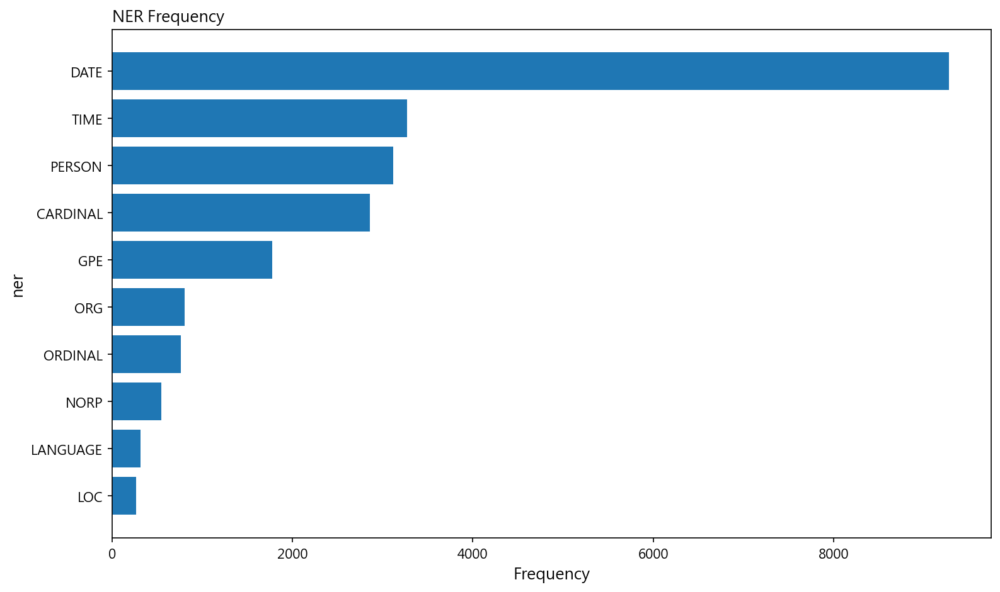

In [65]:
ner = ner_count['ner']
count = ner_count['count']

fig, ax = plt.subplots(figsize =(12, 7))
ax.barh(ner, count)
ax.invert_yaxis()
ax.set_title('NER Frequency',loc ='left', size = 12)
ax.set_ylabel('ner', size = 12)
ax.set_xlabel('Frequency', size = 12)
fig.show()

In [85]:
def Plot_NER_freq(l_noun: str) -> None:
    NORP = entity_table[entity_table.ner.isin([l_noun])]

    # # 計算每個名詞提到的次數，選出前10個
    ner_count = NORP.groupby('word')['word'].agg(['count'])
    ner_count = ner_count.sort_values(['count'],ascending=False)['count'].nlargest(10).reset_index()
    ner_count

    # 設定中文字形
    plt.rcParams['font.sans-serif'] = ['SimHei'] 
    word = ner_count['word']
    count = ner_count['count']

    fig, ax = plt.subplots(figsize =(10, 7))
    ax.barh(word, count)
    ax.invert_yaxis()
    ax.set_title('Word Frequency (NER is '+ l_noun +')',loc ='left', size = 14)
    ax.set_ylabel('NER', size = 14)
    ax.set_xlabel('Word Frequency', size = 14)
    fig.show()

> 查看ner為``norp``的前十個詞彙

C:\Users\qweji\AppData\Local\Temp\ipykernel_9236\1488620920.py:20: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


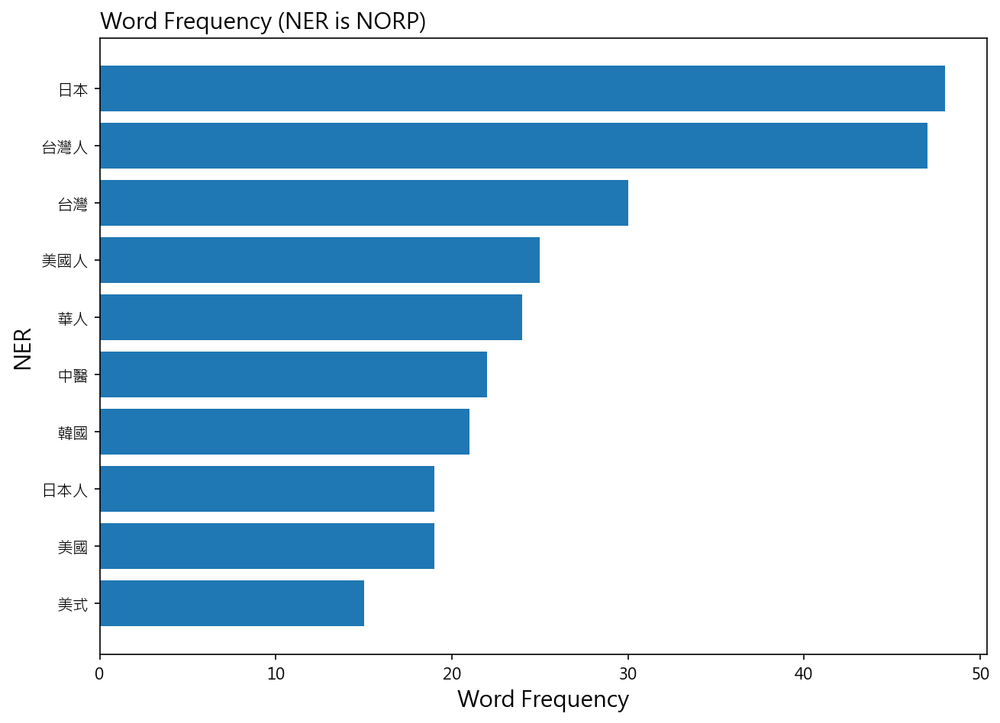

In [86]:
Plot_NER_freq('NORP')

可能聚焦在不同人別進行評論。

> 查看ner為``ORG``的前十個詞彙

C:\Users\qweji\AppData\Local\Temp\ipykernel_9236\1488620920.py:20: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


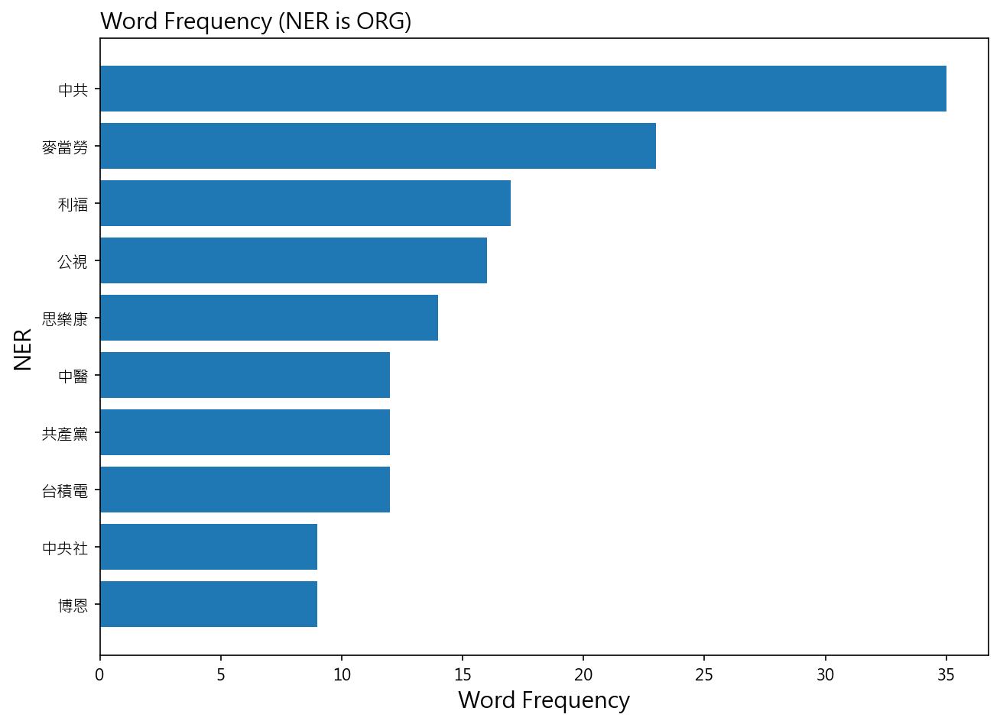

In [88]:
Plot_NER_freq('ORG')

可以發現很多在討論'中共'、'麥當勞'的詞彙，所以特別抓出來看敘述

In [14]:
sentence_table[sentence_table['sentence'].str.contains('中共')].head(10)

,system_id,sentence
29270,1835,在沈默呼聲講述段劇情記者問大學生，你覺得在中共打壓法輪功這件事你個人能做什麼
32465,2005,結束後，繼續聽觀點邀請王立第二戰研所來討論中共及國防，
71874,4264,從對中共被辱華道歉，
78336,4599,假設年被中共武統統
80218,4723,中共說你不聽話不照做會影響三代
80506,4741,小鄭提到這位中共工具人說到
81867,4809,台灣很容易被中共利用來洗白
81869,4809,百靈果被罵中共同路人被罵爆
81880,4809,滿滿對中共政權的諷刺
83012,4836,很遺憾的是用對中共國的敵意來對自己父母


In [13]:
sentence_table[sentence_table['sentence'].str.contains('麥當勞')].head(10)

,system_id,sentence
5059,359,希望麥當勞吃完後心情可以好點
16669,1109,想吃個麥當勞，都還要猶豫半天
39700,2337,目前想往麥當勞或開其他服務業前進
39706,2337,想請問基本上麥當勞跟出國打工會察覺到我有手冊嗎
42908,2483,應徵上麥當勞的打工了已經報道過正在等電話告知我第天的上班時間為了遮我手上自殘
42931,2483,圈好想趕快去麥當勞工作面對客人溝通講話
48254,2760,我今天去麥當勞用餐
52332,3031,認知觀念有次在車上我跟他們說想在麥當勞至少打工年被我爸我媽罵怎麼那麼不上進
52335,3031,先去做麥當勞下班時間再自己做作品集
53252,3095,剛剛吃了難吃的麥當勞，其實點就醒來考慮要去麥當勞吃早餐，但面對天還是沒有動


憂鬱版的文章內其實不乏批評中共制度的文章，除此之外麥當勞似乎也是常出現在憂鬱版的店家

而博恩在這邊則被錯誤分為了ORG

> 查看ner為``PERSON``的前十個詞彙

C:\Users\qweji\AppData\Local\Temp\ipykernel_9236\1488620920.py:20: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


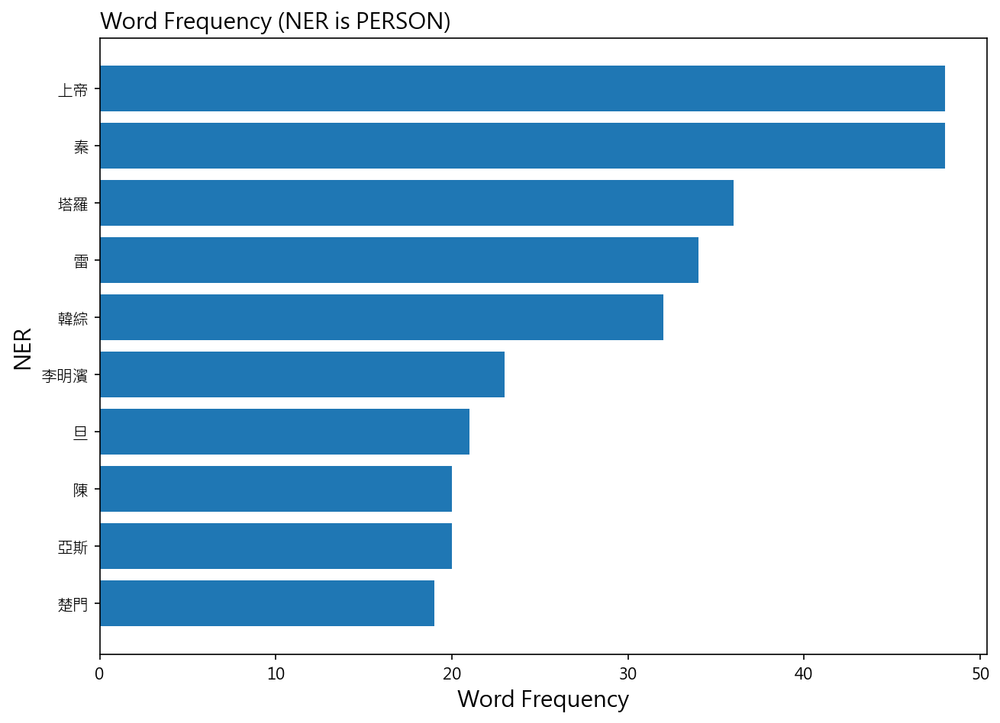

In [89]:
Plot_NER_freq('PERSON')

可以發現很多在討論'上帝'、'塔羅'、'韓綜'的詞彙，所以特別抓出來看敘述

In [15]:
sentence_table[sentence_table['sentence'].str.contains('上帝')]

,system_id,sentence
8242,564,定有的暴食色慾貪婪怠惰以外，看了介紹傲慢是最重的罪，因爲對上帝不敬
8788,610,上帝關了扇門，必會開扇窗
8879,612,上帝好像在開玩笑
16154,1079,醫生說希望上帝保守你
16875,1126,上帝遺忘了救贖
...,...,...
128998,7055,類似太入戲時試著把鏡頭轉成上帝/上天鳥瞰角度
129431,7075,感謝上帝
129541,7085,感謝上帝
131970,7216,真的不懂上帝的旨意是什麼


In [17]:
sentence_table[sentence_table['sentence'].str.contains('塔羅')]

,system_id,sentence
5080,362,決定放生他後開始算塔羅
14860,990,幫我抽了塔羅牌
14868,990,謝謝友情贊助塔羅
17369,1165,塔羅也蠻有可能講到這件事
20095,1323,不用再煩惱下份工作在哪，不用再整天玩塔羅占紫微給自己製造希望，
...,...,...
126808,6930,算命塔羅人類圖星座等等
127300,6961,幫自己算塔羅雷諾曼其實也差不多是這樣了
128863,7046,走算命玄學塔羅潛意識夢境
129897,7108,太迷惘了都在看算命手相面相塔羅占星的東西


In [208]:
sentence_table[sentence_table['sentence'].str.contains('韓綜')].head(10)

,system_id,sentence
25755,1647,蜂蜜水配的韓綜我獨自生活中
28439,1794,看韓綜尹汝貞當年奧斯卡頒獎人的紀錄，羅邀請李瑞鎮演員當經紀人，起出發去的段意外旅程
28441,1794,像是韓綜也很厲害，對愛看電視小孩，喜歡也看了很多
29059,1825,剛剛看完韓綜意外的旅程第四集
30099,1887,看完韓綜意外的旅程羅真的很厲害，很能想到有趣的作品，
30458,1904,以及韓綜我獨自生活及換乘戀愛
31736,1963,加上韓綜我獨自生活換乘戀愛
37920,2259,又看了它的售後服務韓綜山友都市女人們，
38240,2275,最近在看韓綜換乘戀愛，好好看喔，
38253,2275,能夠看到哭的韓綜也太強了吧，


憂鬱版上有許多特殊的詞語用法，例如「雷」作為動詞指的是情緒不穩定，韓綜是韓國綜藝的簡稱、亞斯是亞斯伯格症的簡稱，模型並沒有很好的將其劃好POS


除了上帝這位信仰上受到許多人寄託的心靈支柱外，塔羅似乎也是憂鬱版上流行的占卜卡片。

另外台灣自殺防治協會的理事長李明濱因為涉嫌性騷擾，這件事情也在憂鬱版上引起了討論

> 韓綜節目在憂鬱版上的討論度也非常高，先將這些資料取出來做之後的情緒分析

In [45]:
keyword_list = ['韓綜']
korean_show_selected = df[df['artContent'].str.contains('|'.join(keyword_list),regex=True)]
print(f"{' '.join(keyword_list)}：{korean_show_selected.shape[0]}篇相關貼文")
korean_show_selected.head(5)

韓綜：37篇相關貼文


,system_id,artUrl,artTitle,artDate,artPoster,artCatagory,artContent,artComment,e_ip,insertedDate,dataSource
1646,1647,https://www.ptt.cc/bbs/prozac/M.1663105960.A.E...,[閒聊]睡眠記錄no.18,2022-09-14,qien,prozac,睡眠記錄no.18\n發現自己其實對廚藝不擅常\n尤其不會煮湯\n總是天馬行空亂加東西然後不...,[],220.137.76.241,2022-09-15 02:06:03,ptt
1793,1794,https://www.ptt.cc/bbs/prozac/M.1664067342.A.C...,[閒聊]睡眠記錄no.29,2022-09-25,qien,prozac,睡眠記錄no.29\n很好睡，賴床到七點多，固定晚上九點多開始上床準備入睡，\n拉筋、熱敷、...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""iiyenyuii"", ...",220.137.77.74,2022-09-26 01:59:31,ptt
1824,1825,https://www.ptt.cc/bbs/prozac/M.1664254573.A.9...,[晴天]笑到喉嚨癢癢的,2022-09-27,qien,prozac,笑到喉嚨癢癢的\n我不知道為什麼今天好嗨森？\n一樣心悸亢奮的起床狀態\n一切都跟昨日種種沒...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""qien"", ""cmtC...",220.137.73.173,2022-09-28 01:59:43,ptt
1886,1887,https://www.ptt.cc/bbs/prozac/M.1664581671.A.5...,[閒聊]睡眠記錄no.35,2022-10-01,qien,prozac,睡眠記錄no.35\n昨天好低潮喔\n還是會在意別人的眼光，幹不爽耶\n漸漸去練習不用管那些...,[],220.137.73.173,2022-10-02 01:57:11,ptt
1903,1904,https://www.ptt.cc/bbs/prozac/M.1664703526.A.F...,[閒聊]原來孤獨是真實存在的,2022-10-02,qien,prozac,剛剛看完酒鬼都市女人們第五集\n恩地超帥爆的，為了她真心幫助朋友而大哭！\n那種真正朋友的連...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""badshrimp"", ...",220.137.73.173,2022-10-03 01:56:41,ptt


## 4. 基於 NER 的 PTT 憂鬱版網路圖

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import re
import nltk
import pyvis
import IPython
import random
import networkx as nx
import numpy as np
import names
from itertools import combinations
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
# 隨機生成十六進制顏色碼
def random_color():
  r = lambda: random.randint(0,255)
  return '#%02X%02X%02X' % (r(),r(),r())

# 透過 adjacency matrix 建立 graph
def matPresentGraph(mat:np.array, node_id:list, node_type:list = None, node_value:list = None, directed = True, edge_color = None) -> pyvis.network.Network:
  '''
    根據輸入的matrix建立網路圖
    mat: adjacency matrix
    node_id: 要設定的節點id
    node_type: 用來區分不同類型的節點（例如：不同群組），會作為節點的title
    node_value: 節點大小
    directed: 有向/無向
    edge_color: edge顏色

  '''

  # 如果設定為無向圖，則檢查輸入的 matrix 是否對稱
  if directed != True:
    if (mat == mat.transpose()).all():
      print('matrix is Symmetric')
    else:
      print('matrix is not Symmetric')

  # 若無設定 node_type，則為所有節點設置相同的顏色(隨機)和類型
  if node_type == None:
    c = random_color()
    node_colors = [c for i in range(len(node_id))]
    node_type = [" " for i in range(len(node_id))]

  else: # 若有設定node_type，則為每種類型分配一個隨機顏色
    node_color_map = {}

    for i in set(node_type):
      while True:
        c = random_color()
        if c not in node_color_map.values():
          break
      node_color_map[i] = c

    node_colors = [node_color_map[i] for i in node_type]

  # 若無設定edge_color，則設置隨機顏色
  if edge_color == None:
    edge_color = random_color()
  # edge_color = random_color()

  # 若無設定node_value，則設定所有節點的大小為1
  if node_value == None:
    node_value = [1 for i in range(len(node_id))]

  net = pyvis.network.Network(notebook=True, directed = directed, cdn_resources='in_line')

  # 加入點
  net.add_nodes(
      nodes = node_id,
      value = node_value,
      label = node_id,
      title = node_type,
      color = node_colors
  )

  # 加入邊
  for row in range(len(node_id)):
    for col in range(len(node_id)):
      if mat[row][col] > 0.:
        net.add_edge(
            node_id[row], node_id[col], width = mat[row][col], color = edge_color, title = mat[row][col]
        )

  return net

In [ ]:
entity_table = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/raw_data/entity_table_melancholy.csv")

### 篩選
篩選 ner 結果為 ["PERSON","PRODUCT"] 的欄位。

In [ ]:
# 篩選ner為[PERSON, PRODUCT]的資料
l_noun = ["PERSON", "PRODUCT"]
PERSON = entity_table[entity_table.ner.isin(l_noun)]
PERSON

,system_id,word,ner
4,5,謝巖谷,PERSON
8,5,文昌,PERSON
54,25,開金菩薩,PERSON
95,41,代發文,PERSON
148,66,旦,PERSON
...,...,...,...
23767,7480,周處,PERSON
23769,7480,黃,PERSON
23771,7480,榮格,PERSON
23773,7480,藤井風,PERSON


### 清除不相關字詞

In [ ]:
remove_list = ['哈哈哈', '耶耶', '林北', '尼克星', "李育昇", "馬的", "馬英九", "蔡英文", "賴清德", "柯文哲", "蕭敬騰", "韓綜", "阿不", "周杰倫", "汪小菲", "川普",
               "王力宏", "百靈果", "凱莉", "露西", "賀瓏", "李光洙", "洪仲清", "博恩", "曾博恩", "劉德華", "范琪斐", "薩泰爾", "志祺", "沈伯洋", "邰智源", "曹興誠"
               "謝謝", "維基百科", "賽博龐克", "瓦力", "謝謝板", "李瑞鎮", "尹汝貞", "白貓", "蔡哥", "甄嬛傳", "謝謝版", "迪拉", "芙莉蓮", "七龍珠", "蔡明亮", "馬斯克"
               ,"薛丁格", "蔡康永", "瑜伽球", "阿彌陀佛", "迪拉胖", "高行健", "杜汶澤", "哈利波特", "匿名", "永康緒", "科秘", "西斯", "千千",
               "老子", "黃明志", "諸葛", "阿北", "枝裕和", "瑞秋", "銃康", "東東", "奧斯卡", "草東", "卡卡", "吳宗憲", "艾蓮", "艾爾文", "瑞克", "莫提",
               "唐國師", "艾連", "百靈果凱莉", "馬克", "阿滴", "馬克瑪麗", "老王", "卡頓", "塔羅占卜", "占卜塔羅", "恩希俊", "神隱", "布蘭", "宮崎駿", "宇多田光", "奧本海默"
               ,"上帝"]
PERSON = PERSON[~PERSON.word.isin(remove_list)]
PERSON

,system_id,word,ner
4,5,謝巖谷,PERSON
8,5,文昌,PERSON
54,25,開金菩薩,PERSON
95,41,代發文,PERSON
148,66,旦,PERSON
...,...,...,...
23767,7480,周處,PERSON
23769,7480,黃,PERSON
23771,7480,榮格,PERSON
23773,7480,藤井風,PERSON


In [ ]:
df_person = PERSON.groupby('system_id')['word'].agg(lambda x: ' '.join(x)).reset_index()
df_person.head()

,system_id,word
0,5,謝巖谷 文昌
1,25,開金菩薩
2,41,代發文
3,66,旦
4,67,舒跑


In [ ]:
vectorizer = CountVectorizer(min_df = 3, max_features = 100)
X = vectorizer.fit_transform(df_person["word"])
vocabulary = vectorizer.get_feature_names_out()

# 轉成dataframe
df_DTM = pd.DataFrame(columns = vocabulary, data = X.toarray())
df_DTM

,三毛,丹妮,亞斯,亞斯伯格,亞斯蘭黛,冰淇淋,切安,勒索,千憂解,原生家庭,...,金剛經,閨蜜,阿德勒,阿摩,陳凝觀,陳韻如,雪碧,雷文,高敏,魯迅
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1442,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1443,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1444,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1445,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# 計算詞之間的相關係數
corr_matrix = np.corrcoef(df_DTM.T)

# 轉成dataframe
df_cor = pd.DataFrame(corr_matrix, index = df_DTM.columns, columns = df_DTM.columns)

df_cor.reset_index(inplace = True, drop = True)

df_cor.head()

,三毛,丹妮,亞斯,亞斯伯格,亞斯蘭黛,冰淇淋,切安,勒索,千憂解,原生家庭,...,金剛經,閨蜜,阿德勒,阿摩,陳凝觀,陳韻如,雪碧,雷文,高敏,魯迅
0,1.000000,-0.003786,-0.005156,-0.002778,-0.002572,-0.001973,-0.003210,-0.007599,-0.002267,-0.005583,...,-0.002587,-0.002542,-0.003044,-0.002267,-0.002267,-0.003025,-0.002474,-0.002619,-0.004917,-0.002619
1,-0.003786,1.000000,-0.007890,-0.004251,-0.003935,-0.003019,-0.004911,-0.011627,-0.003469,0.060125,...,-0.003958,-0.003889,-0.004658,-0.003469,-0.003469,-0.004629,-0.003786,-0.004007,-0.007523,-0.004007
2,-0.005156,-0.007890,1.000000,-0.005790,-0.005359,-0.004112,-0.006689,-0.015837,-0.004725,0.035130,...,-0.005391,-0.005298,-0.006345,-0.004725,-0.004725,-0.006305,-0.005156,-0.005458,0.042706,-0.005458
3,-0.002778,-0.004251,-0.005790,1.000000,0.074488,-0.002215,-0.003604,-0.008533,-0.002546,-0.006269,...,0.251835,-0.002854,-0.003418,-0.002546,-0.002546,-0.003397,-0.002778,-0.002941,-0.005521,0.174357
4,-0.002572,-0.003935,-0.005359,0.074488,1.000000,-0.002050,-0.003336,-0.007898,-0.002356,-0.005802,...,-0.002689,-0.002642,-0.003164,-0.002356,-0.002356,-0.003144,-0.002572,-0.002722,-0.005110,-0.002722


In [ ]:
# 讓對角等於0
mat = df_cor.values

di = [i for i in range(mat.shape[0])]
mat[di,di] = 0
mat[mat<0.1] = 0
mat = mat*10

mat

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

### 繪製網路圖

In [ ]:
list_person = vocabulary

net = matPresentGraph(mat,list_person,directed = False)
net.show("./netWork.html")
IPython.display.HTML('netWork.html')

matrix is not Symmetric
./netWork.html


In [ ]:
list_person = vocabulary

net = matPresentGraph(mat,list_person,directed = False)
net.show("./netWork.html")
IPython.display.HTML('netWork.html')

matrix is not Symmetric
./netWork.html


有一個區塊偏向於電影明星或公眾人物，例如強尼戴普、芭比、阿滴、恩希俊, 韓國明星的名字，代表在憂鬱版討論的人名多為影視版的公眾人物， 相關的人物之間也容易有連線。

合理推測公眾人物的影響力容易對憂鬱版的用戶造成心理上壓力，在憂鬱版上一再的被提到。
部分文本如下：

```markdown
1. 好吧我其實是聽 **博恩** podcast 回問題憂鬱症患者是不是對站立喜劇笑不出來？
2. 因為太頻繁到最後變成不太嚴重就根本忘記算了的程度(跟**強尼戴普**說喔對我忘記了那是前妻當時用香煙燙我的傷有異曲同工之妙)
```

在圖表部分區塊聚集如景安寧、思樂康，這都是抗憂鬱藥物的名稱， 由此可知藥物的討論在憂鬱版上有一定的討論度，觀察各篇文章內容發現這些藥物都會一起出現。相關的文章如下：
```markdown
1. 然後要持續吃一段時間，比起她吃的**贊安諾**、**景安寧**之類的，都比較像是治標類的抗焦慮藥物SSRI類的藥物就我看來應該是最直接治療到根本的藥物。
2. 中間有經歷過一陣子的換藥 從**景安寧**  **萬憂停**等藥物去換，後來換到現在吃的**煩多閃**+**腦樂靜**(睡前)+**克癲平**(睡前)整體來說吃了煩多閃以後整個狀況調整恢復的很快。
```
### 小結
**「藥物」、「公眾人物」相關詞彙都是容易在憂鬱版上的常客**。



## 5. 利用SnowNLP進行情緒分析

In [37]:
from snownlp import SnowNLP

In [48]:
sentence_table = pd.read_csv("raw_data/sentence_table_buffet.csv") #匯資料

sentiment_date = pd.merge(sentence_table,korean_show_selected[['system_id','artDate','dataSource']],on='system_id',how='left').dropna()
sentiment_date.head(5)

,system_id,sentence,artDate,dataSource
25736,1647,睡眠記錄,2022-09-14,ptt
25737,1647,發現自己其實對廚藝不擅常,2022-09-14,ptt
25738,1647,尤其不會煮湯,2022-09-14,ptt
25739,1647,總是天馬行空亂加東西然後不好喝,2022-09-14,ptt
25740,1647,頗有實驗精神的不是,2022-09-14,ptt


In [49]:
def get_sentiment(sent):
    s = SnowNLP(sent)
    return s.sentiments

# 幫每句話加上情緒分數
sentiment_date['sentimentValue'] = sentiment_date.apply(lambda row : get_sentiment(row['sentence'],), axis = 1)
sentiment_date.head(5)

,system_id,sentence,artDate,dataSource,sentimentValue
25736,1647,睡眠記錄,2022-09-14,ptt,0.501755
25737,1647,發現自己其實對廚藝不擅常,2022-09-14,ptt,0.730310
25738,1647,尤其不會煮湯,2022-09-14,ptt,0.362396
25739,1647,總是天馬行空亂加東西然後不好喝,2022-09-14,ptt,0.020066
25740,1647,頗有實驗精神的不是,2022-09-14,ptt,0.568551


In [50]:
# 看一下情緒的分布
sentiment_date['sentimentValue'].describe()

count    1802.000000
mean        0.462009
std         0.329982
min         0.000020
25%         0.145632
50%         0.435810
75%         0.760342
max         0.999813
Name: sentimentValue, dtype: float64

<Axes: >

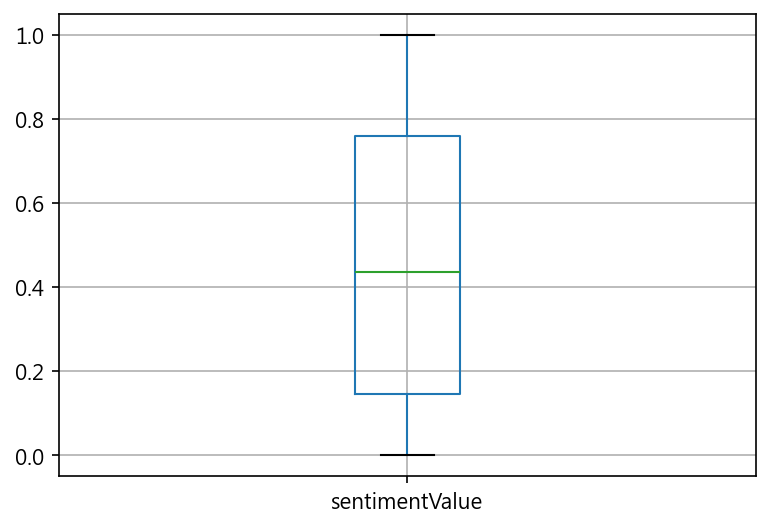

In [51]:
# 情緒分布的盒狀圖
boxplot = sentiment_date.boxplot(column=['sentimentValue'], showfliers=False)
boxplot

將每個月的情緒分數取平均，並轉換時間格式為年月

In [53]:
sent_date = sentiment_date.copy()
sent_date['artDate'] =  pd.to_datetime(sentiment_date['artDate']).dt.to_period('M')

sentiment_count = sent_date.groupby(['artDate'])['sentimentValue'].mean().reset_index()
sentiment_count.head(5)

,artDate,sentimentValue
0,2022-09,0.477474
1,2022-10,0.456810
2,2022-11,0.484549
3,2022-12,0.465638
4,2023-06,0.364113


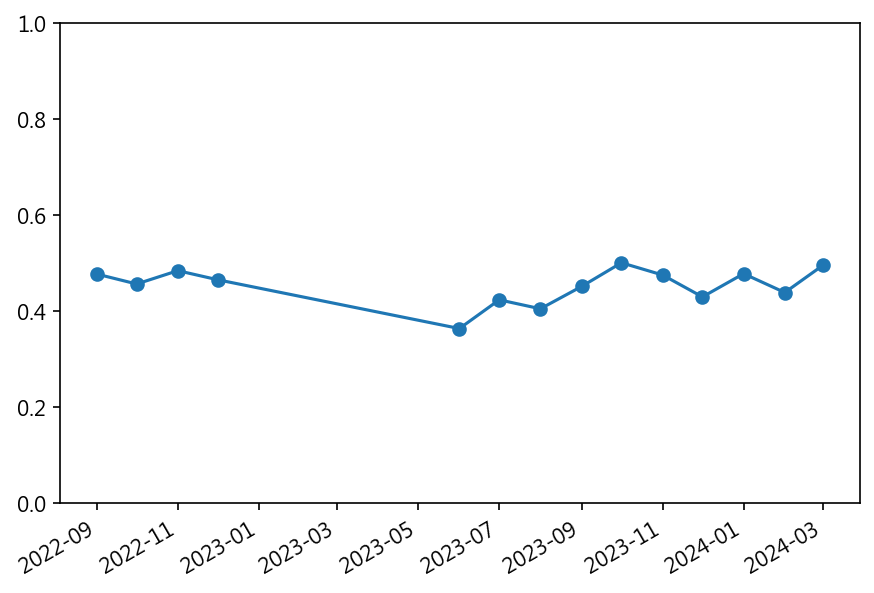

In [55]:
# 平均情緒分數時間趨勢
months = [period.to_timestamp() for period in sentiment_count['artDate']]   # 將 PeriodIndex 中的每個 Period 物件轉換為對應的 datetime 物件
y = sentiment_count['sentimentValue']


plt.plot_date(months, y, linestyle='solid')
plt.gcf().autofmt_xdate()
plt.tight_layout()
plt.ylim(0, 1)

plt.show()

憂鬱版對於韓綜節目的評價似乎偏向中性，並沒有特別的好惡。

> 以下以相對分數較高的``2024-03``做分析

In [56]:
filter_sentiment = sent_date[sent_date['artDate']=='2024-03']
filter_sentiment = filter_sentiment.loc[filter_sentiment['sentimentValue'] > 0.7]

filter_sentiment.head()

,system_id,sentence,artDate,dataSource,sentimentValue
127121,6951,用淡淡的哀傷看韓綜玩什麼好呢,2024-03,ptt,0.999452
127122,6951,新的集終於不再是真實職場生活,2024-03,ptt,0.917011
127123,6951,雖然大概知道製作單位企劃的意圖,2024-03,ptt,0.858654
127131,6951,不用花腦筋思考的,2024-03,ptt,0.820357
127134,6951,我還是笑的出來,2024-03,ptt,0.829703


In [57]:
# 把時間分數和之前斷詞的 token table 做 join
pos_words = pd.merge(filter_sentiment,pos_table,on='system_id',how='left')
pos_words = pos_words[['system_id','sentimentValue','word']]
pos_words.head()

,system_id,sentimentValue,word
0,6951,0.999452,用
1,6951,0.999452,淡淡
2,6951,0.999452,的
3,6951,0.999452,哀傷
4,6951,0.999452,看


In [58]:
# 篩選掉只有單個字元的結果
pos_words = pos_words[pos_words.apply(lambda x: len(x['word'])>1, axis=1)]

In [10]:
# 自定停用字
with open('dict/old_stopwords.txt') as f:
    stop_words = f.read().splitlines()

print(stop_words)

['$', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '?', '_', '“', '”', '、', '。', '《', '》', '一', '一些', '一何', '一切', '一則', '一方面', '一旦', '一來', '一樣', '一般', '一轉眼', '萬一', '上', '上下', '下', '不', '不僅', '不但', '不光', '不單', '不只', '不外乎', '不如', '不妨', '不盡', '不盡然', '不得', '不怕', '不惟', '不成', '不拘', '不料', '不是', '不比', '不然', '不特', '不獨', '不管', '不至於', '不若', '不論', '不過', '不問', '與', '與其', '與其說', '與否', '與此同時', '且', '且不說', '且說', '兩者', '個', '個別', '臨', '為', '為了', '為什麼', '為何', '為止', '為此', '為著', '乃', '乃至', '乃至於', '麼', '之', '之一', '之所以', '之類', '烏乎', '乎', '乘', '也', '也好', '也罷', '了', '二來', '於', '於是', '於是乎', '云云', '云爾', '些', '亦', '人', '人們', '人家', '什麼', '什麼樣', '今', '介於', '仍', '仍舊', '從', '從此', '從而', '他', '他人', '他們', '以', '以上', '以為', '以便', '以免', '以及', '以故', '以期', '以來', '以至', '以至於', '以致', '們', '任', '任何', '任憑', '似的', '但', '但凡', '但是', '何', '何以', '何況', '何處', '何時', '余外', '作為', '你', '你們', '使', '使得', '例如', '依', '依據', '依照', '便於', '俺', '俺們', '倘', '倘使', '倘或', '倘然', '倘若', '借', '假使', '假如', '假若', '儻然', '像', '兒', '先不先', '光是', '全體', '全部', '

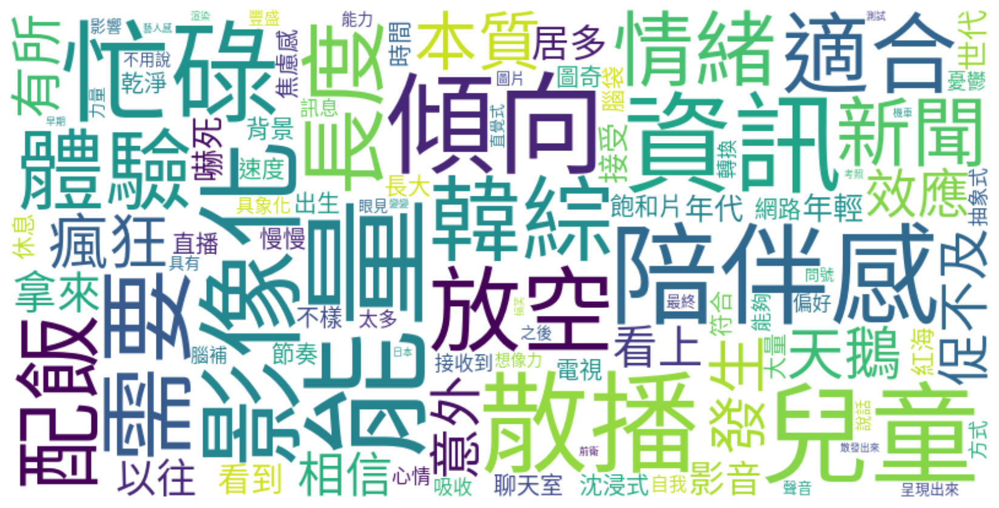

In [71]:
# 匯入自訂的 stop words (預設只有英文的)
stop_words_pos = stop_words
stop_words_pos.extend(('文字','世界','時代','分鐘','影片','秒鐘','現在','事情','越來越'))
stop_words_pos = set(stop_words_pos)

# 設定中文字形
font_path = 'TaipeiSansTCBeta-Regular.ttf'

# 可以設定字型大小和背景顏色
wordcloud = WordCloud(
                stopwords=stop_words_pos,
                collocations=False,
                font_path=FontPath,
                width=800, 
                height = 400, 
                max_words=100, 
                background_color="white")

wordcloud.generate(' '.join(pos_words['word']))
# Display the generated image:
plt.figure(figsize = (14,7))
plt.imshow(wordcloud, interpolation="bilinear")

plt.axis("off")
plt.show()

能量、陪伴感、放空，這些詞可能代表韓綜對於憂鬱版的人是一種心靈上的糧食。

## 6.分析憂鬱版文章之詞彙關係

In [7]:
import networkx as nx
from sklearn.feature_extraction.text import CountVectorizer,TfidfTransformer
from sklearn.metrics.pairwise import cosine_similarity

進行前處理 

In [186]:
MetaData = clear_df.copy()

# 只留下中文字
MetaData['sentence'] = MetaData['artContent'].apply(lambda x: re.sub('[^\u4e00-\u9fff]+', '',x))

MetaData.head(3)

,system_id,artUrl,artTitle,artDate,artContent,sentence
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,今天打疫苗順便問了醫生身體一直存在不舒服的症狀雖然兩年前檢查過沒診斷出什麼但是這症狀一直存在...
1,2,https://www.ptt.cc/bbs/prozac/M.1650331853.A.C...,[陰天]自信,2022-04-19,沒自信真是我的致命傷\n\n其實腦中都可以想像自信的樣子要怎麼演\n\n但實際想演的時候就縮...,沒自信真是我的致命傷其實腦中都可以想像自信的樣子要怎麼演但實際想演的時候就縮了好討厭自己也因...
2,3,https://www.ptt.cc/bbs/prozac/M.1650344674.A.D...,[陰天]醫生,2022-04-19,這兩個月跑去大醫院看\n原本以為長效針還有效\n結果還是沒辦法 無感了\n不知道要怎麼辦\n...,這兩個月跑去大醫院看原本以為長效針還有效結果還是沒辦法無感了不知道要怎麼辦都無感了大醫院的醫...


In [8]:
# 設定斷詞 function
def getToken(row):
    seg_list = jieba.lcut(row)
    seg_list = [w for w in seg_list if w not in stop_words and len(w)>1] # 篩選掉停用字與字元數小於1的詞彙

    return seg_list

In [11]:
melancholy = MetaData.copy()

melancholy['sentence'] = melancholy['sentence'].apply(lambda x: re.sub('[^\u4e00-\u9fff]+', '',x))

# 保留需要的欄位
melancholy = melancholy.loc[:,["system_id", "sentence"]]

# 改成使用空格連接斷完的詞
melancholy['word'] = melancholy.sentence.apply(getToken).map(' '.join)

melancholy

,system_id,sentence,word
0,1,今天打疫苗順便問了醫生身體一直存在不舒服的症狀,今天 疫苗 順便問 醫生 身體 一直 存在 舒服 症狀
1,1,雖然兩年前檢查過沒診斷出什麼,年前 檢查過 沒診斷 出什麼
2,1,但是這症狀一直存在,這症 一直 存在
3,1,感覺也不是很普通常見的那種,感覺 普通 常見 那種
4,1,問了醫生過兩年還需要檢查嗎,問了 醫生過 兩年還 需要 檢查
...,...,...,...
179425,7487,拜託爛身體不要再耍智障了,爛身體 智障
179426,7487,老子要實習還要期中考,老子 實習 期中考
179427,7487,還要寫一堆作業,一堆 作業
179428,7487,好想吐好想吐好想吐,


In [20]:
# Bag of Word
# 資料筆數過多，隨機取樣十分之一用於分析
sampled_data = melancholy.sample(frac=0.1, random_state=42)

vectorizer = CountVectorizer()
X = vectorizer.fit_transform(sampled_data["word"])
vocabulary = vectorizer.get_feature_names_out()

# 轉成 dataframe
DTM_df = pd.DataFrame(columns = vocabulary, data = X.toarray())
DTM_df

,一一,一丁,一下,一下下,一下子,一不小心,一不弄,一了百了,一事,一井之大,...,鼻炎,鼻酸,齋戒,龍珠,龍蝦,龍龍,龐克性,龐克高,龐大,龜縮
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17938,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17939,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17940,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17941,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [21]:
transformer = TfidfTransformer()  
# 將詞頻矩陣X統計成TF-IDF值
tfidf = transformer.fit_transform(X)  

# 轉成dataframe
TFIDF_df = pd.DataFrame(columns = vocabulary, data = tfidf.toarray())

TFIDF_df

,一一,一丁,一下,一下下,一下子,一不小心,一不弄,一了百了,一事,一井之大,...,鼻炎,鼻酸,齋戒,龍珠,龍蝦,龍龍,龐克性,龐克高,龐大,龜縮
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17938,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17939,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17940,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17941,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [22]:
#計算前十個詞彙
melancholy_tfidf = TFIDF_df.mean().to_frame().reset_index()
melancholy_tfidf.columns = ["word", "avg"]

melancholy_tfidf.sort_values('avg', ascending = False).head(10)

,word,avg
10325,知道,0.008947
4910,工作,0.005346
160,一直,0.005281
1141,今天,0.005080
9918,痛苦,0.004431
14076,醫生,0.004213
4975,希望,0.004186
527,不想,0.004105
7408,時間,0.003943
5947,感覺,0.003894


In [23]:
toptens = TFIDF_df.copy()
toptens.insert(0, 'doc_id', toptens.index+1)

toptens

,doc_id,一一,一丁,一下,一下下,一下子,一不小心,一不弄,一了百了,一事,...,鼻炎,鼻酸,齋戒,龍珠,龍蝦,龍龍,龐克性,龐克高,龐大,龜縮
0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17938,17939,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17939,17940,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17940,17941,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17941,17942,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [25]:
toptens = toptens.melt(id_vars = "doc_id", var_name = "word", value_name = 'tfidf')
toptens

,doc_id,word,tfidf
0,1,一一,0.0
1,2,一一,0.0
2,3,一一,0.0
3,4,一一,0.0
4,5,一一,0.0
...,...,...,...
273038626,17939,龜縮,0.0
273038627,17940,龜縮,0.0
273038628,17941,龜縮,0.0
273038629,17942,龜縮,0.0


In [26]:
(
    # 從每篇文章挑選出tf-idf最大的前十個詞
    toptens.groupby("doc_id").apply(lambda x : x.nlargest(10, "tfidf")).reset_index(drop=True)
   
    # 計算每個詞被選中的次數
    .groupby(['word'],as_index=False).size()

).sort_values('size', ascending=False).head(10) # 排序看前十名

,word,size
0,一一,17876
1,一丁,17803
2,一下,17687
3,一下下,17419
4,一下子,16890
5,一不小心,15754
6,一不弄,13704
7,一了百了,10349
8,一事,6050
9,一井之大,2582


建立N-gram 

In [48]:
ngram_df = MetaData.copy()

ngram_df['sentence'] = ngram_df['sentence'].apply(lambda x: re.sub('[^\u4e00-\u9fff]+', '',x))

In [32]:
# 設定 ngram 斷詞 function
def ngram_getToken(row, n):
    # 進行斷詞
    seg_list = jieba.lcut(row)

    # 篩選掉停用字與字元數小於1的詞彙
    seg_list = [w for w in seg_list if w not in stop_words and len(w)>1]

    # ngram斷詞
    seg_list = ngrams(seg_list, n)
    seg_list = [" ".join(w) for w in list(seg_list)]
    
    return seg_list

In [39]:
# bi-gram
melancholy_bigram = MetaData.copy()

melancholy_bigram["word"] = melancholy_bigram['sentence'].apply(lambda row: ngram_getToken(row, 2))
melancholy_bigram = melancholy_bigram.explode('word')

melancholy_bigram.head(3)

,system_id,artUrl,artTitle,artDate,artContent,sentence,word
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,今天打疫苗順便問了醫生身體一直存在不舒服的症狀,今天 疫苗
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,今天打疫苗順便問了醫生身體一直存在不舒服的症狀,疫苗 順便問
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,今天打疫苗順便問了醫生身體一直存在不舒服的症狀,順便問 醫生


In [45]:
# 計算每個組合出現的次數
melancholy_bigram_count = melancholy_bigram['word'].value_counts().reset_index()

melancholy_bigram_count.sort_values('count', ascending=False).head(15)

,word,count
0,一段 時間,111
1,原生 家庭,107
2,晚安 晚安,87
3,一直 一直,84
4,知道 是不是,76
5,冷靜 冷靜,68
6,情緒 勒索,65
7,心理 治療,63
8,這件 事情,63
9,負面 情緒,62


In [41]:
# Tri-gram
melancholy_trigram = ngram_df.copy()

melancholy_trigram["word"] = melancholy_trigram.sentence.apply(lambda row: ngram_getToken(row, 3))
melancholy_trigram = melancholy_trigram.explode('word')

melancholy_trigram.head(3)

,system_id,artUrl,artTitle,artDate,artContent,sentence,word
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,今天打疫苗順便問了醫生身體一直存在不舒服的症狀,今天 疫苗 順便問
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,今天打疫苗順便問了醫生身體一直存在不舒服的症狀,疫苗 順便問 醫生
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,今天打疫苗順便問了醫生身體一直存在不舒服的症狀,順便問 醫生 身體


In [44]:
# 計算每個組合出現的次數
melancholy_trigram_count = melancholy_trigram['word'].value_counts().reset_index()

melancholy_trigram_count.sort_values('count', ascending=False).head(15)

,word,count
0,冷靜 冷靜 冷靜,44
1,佛南 阿彌陀 佛南,37
2,自律 神經 失調,29
3,阿彌陀 佛南 阿彌陀,27
4,一直 一直 一直,22
5,沒事 沒事 沒事,19
6,啊啊啊 啊啊啊 啊啊啊,15
7,自我 感覺 良好,14
8,創傷 壓力 症候群,12
13,推文 改善 劣退,10


看的出來憂鬱版有些感嘆詞連用的狀況十分頻繁

在用詞方面，"情緒" "勒索"這兩個詞可以結合在一起，除此之外還有"自律"和"神經"、"創傷壓力症候群"、"心理治療"等詞語，接下來會修改斷詞字典使斷詞更精確

In [100]:
jieba.load_userdict('./dict/user_dict.txt')

In [47]:
data2 = ngram_df.copy()

data2['word'] = data2.sentence.apply(getToken)
data2 = data2.explode('word')

data2.head(3)

,system_id,artUrl,artTitle,artDate,artContent,sentence,word
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,今天打疫苗順便問了醫生身體一直存在不舒服的症狀,今天
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,今天打疫苗順便問了醫生身體一直存在不舒服的症狀,疫苗
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,今天打疫苗順便問了醫生身體一直存在不舒服的症狀,順便問


In [91]:
bigrammdist = MetaData.copy()

bigrammdist["word"] = bigrammdist['sentence'].apply(lambda row: ngram_getToken(row, 2))
bigrammdist = bigrammdist.explode('word')

bigrammdist.head(3)

,system_id,artUrl,artTitle,artDate,artContent,sentence,word
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,今天打疫苗順便問了醫生身體一直存在不舒服的症狀,今天 疫苗
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,今天打疫苗順便問了醫生身體一直存在不舒服的症狀,疫苗 順便問
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,今天打疫苗順便問了醫生身體一直存在不舒服的症狀,順便問 醫生


In [92]:
bigrammdist['word'] = bigrammdist['word'].astype(str).replace('nan', pd.NA)

bigrammdist = bigrammdist.dropna(subset=['word'])

# 使用FreqDist 取得 bigram 斷詞 與 bigram出現頻率
bigrammdist = FreqDist(bigrammdist['word'].apply(lambda x: tuple(x.split(' '))))
bigrammdist.most_common(5)

[(('一段', '時間'), 111),
 (('原生', '家庭'), 107),
 (('晚安', '晚安'), 87),
 (('一直', '一直'), 84),
 (('知道', '是不是'), 76)]

In [93]:
# 建立bigram和count的dictionary
# 這裡取最多的前50項
d = {k:v for k,v in bigrammdist.most_common(50)}

In [94]:
# Create network plot 
G = nx.Graph()

# 建立 nodes 間的連結
for k, v in [d][0].items():
    G.add_edge(k[0], k[1], weight=v) # nodes：詞彙，weight：組合出現頻率
    
# 取得edge權重
weights = [w[2]['weight']*0.01 for w in  G.edges(data=True)]

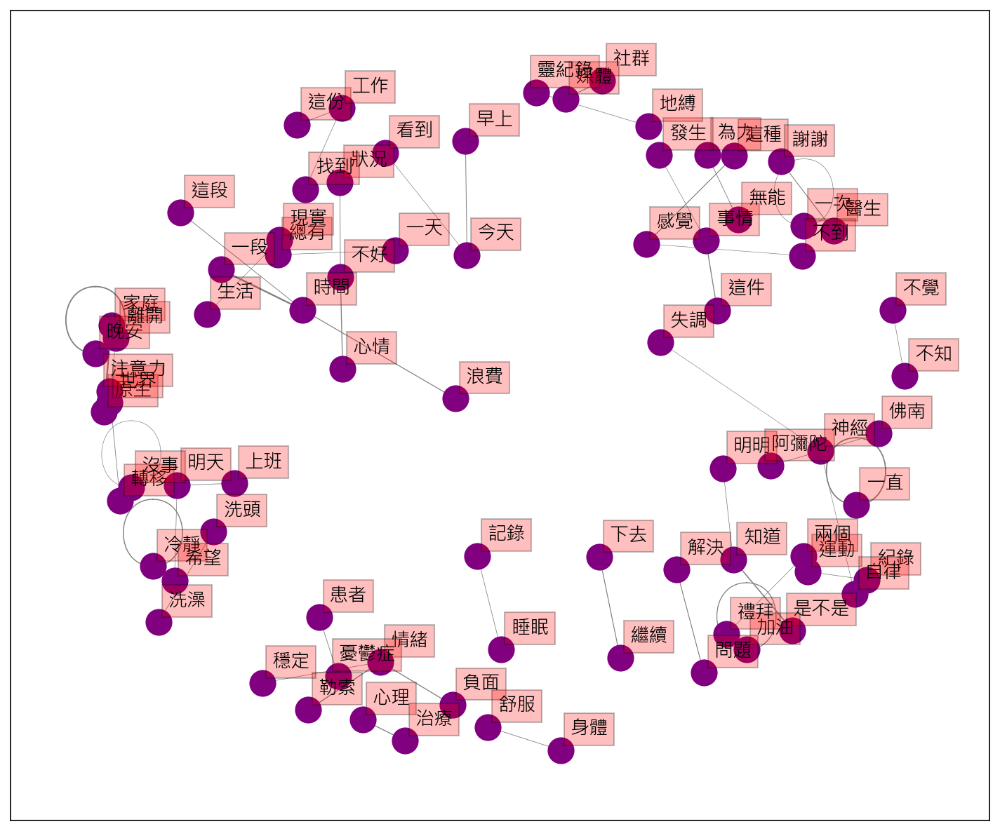

In [95]:
fig, ax = plt.subplots(figsize=(12, 10))

pos = nx.spring_layout(G, k=1.5)

# networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=weights,
                 edge_color='grey',
                 node_color='purple',
                 with_labels = False,
                 ax=ax)

# 增加 labels
for key, value in pos.items():
    x, y = value[0]+.07, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
plt.show()

可以看出一些明顯連結像是心理健康、神佛信仰、日常生活等分群。

計算Pariwise correlation 

In [187]:
data_cor = MetaData.copy()

# 需要改成使用空格連接斷好的詞
data_cor['word'] = data_cor.sentence.apply(getToken).map(' '.join)
data_cor.head(3)

,system_id,artUrl,artTitle,artDate,artContent,sentence,word
0,1,https://www.ptt.cc/bbs/prozac/M.1650303219.A.4...,[陰天]身體,2022-04-19,今天打疫苗順便問了醫生身體一直存在不舒服的症狀\n雖然兩年前檢查過沒診斷出什麼\n但是這症狀...,今天打疫苗順便問了醫生身體一直存在不舒服的症狀雖然兩年前檢查過沒診斷出什麼但是這症狀一直存在...,今天 疫苗 順便問 醫生 身體 一直 存在 舒服 症狀 年前 檢查過 沒診斷 出什麼 這症 ...
1,2,https://www.ptt.cc/bbs/prozac/M.1650331853.A.C...,[陰天]自信,2022-04-19,沒自信真是我的致命傷\n\n其實腦中都可以想像自信的樣子要怎麼演\n\n但實際想演的時候就縮...,沒自信真是我的致命傷其實腦中都可以想像自信的樣子要怎麼演但實際想演的時候就縮了好討厭自己也因...,自信 真是 致命 傷其 實腦 想像 自信 樣子 實際 想演 討厭 育幼院 小孩 根本
2,3,https://www.ptt.cc/bbs/prozac/M.1650344674.A.D...,[陰天]醫生,2022-04-19,這兩個月跑去大醫院看\n原本以為長效針還有效\n結果還是沒辦法 無感了\n不知道要怎麼辦\n...,這兩個月跑去大醫院看原本以為長效針還有效結果還是沒辦法無感了不知道要怎麼辦都無感了大醫院的醫...,這兩個 醫院 效針還 有效 辦法 無感 知道 無感 醫院 醫生 運動 開鎮定 知道 醫生 反...


In [188]:
# Bag of Word
# 篩選至少出現在5篇文章以上且詞頻前300的詞彙
vectorizer = CountVectorizer(min_df = 5, max_features = 300)
X = vectorizer.fit_transform(data_cor["word"])
vocabulary = vectorizer.get_feature_names_out()

# 轉成dataframe
DTM_df = pd.DataFrame(columns = vocabulary, data = X.toarray())
DTM_df

,一下,一件,一句,一堆,一天,一年,一次,一段,一直,一種,...,重新,重要,開心,關心,陪伴,離開,難過,需要,面對,黑暗
0,0,0,0,0,0,0,0,0,2,0,...,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7471,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7472,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7473,0,0,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,2,0,0
7474,1,0,2,0,0,0,0,0,2,0,...,0,0,0,0,0,1,0,0,0,0


In [189]:
# 計算詞之間的相關係數
corr_matrix = np.corrcoef(DTM_df.T)

# 轉成dataframe
Cor_df = pd.DataFrame(corr_matrix, index = DTM_df.columns, columns = DTM_df.columns)

Cor_df.insert(0, 'word1', Cor_df.columns)
Cor_df.reset_index(inplace = True, drop = True)

Cor_df

,word1,一下,一件,一句,一堆,一天,一年,一次,一段,一直,...,重新,重要,開心,關心,陪伴,離開,難過,需要,面對,黑暗
0,一下,1.000000,0.044081,0.030836,0.058498,0.076275,0.044991,0.091926,0.065519,0.083940,...,0.048314,0.067896,0.062443,0.026283,-0.000011,0.033200,0.026633,0.126067,0.035419,0.038368
1,一件,0.044081,1.000000,0.010275,0.015559,0.048958,0.023638,0.041554,0.046146,0.050965,...,0.027491,0.055152,0.049805,0.011393,-0.000815,0.019388,0.025223,0.082651,0.038983,0.037803
2,一句,0.030836,0.010275,1.000000,0.040408,0.075796,0.000838,0.053153,0.053064,0.081922,...,0.014531,0.008096,0.037301,0.037065,0.013285,0.033792,0.039095,0.075124,0.005908,0.047406
3,一堆,0.058498,0.015559,0.040408,1.000000,0.039229,0.024553,0.044687,0.001182,0.078655,...,0.010455,0.096302,0.052753,0.025877,0.000612,0.026824,0.001105,0.086106,0.024690,0.024647
4,一天,0.076275,0.048958,0.075796,0.039229,1.000000,0.036631,0.119847,0.028480,0.121167,...,0.066281,0.049322,0.040959,0.054508,0.013626,0.035691,0.040171,0.098857,0.035309,0.036552
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,離開,0.033200,0.019388,0.033792,0.026824,0.035691,0.034038,0.074744,0.025776,0.054212,...,0.024035,0.004710,0.044311,0.027142,0.034187,1.000000,0.075193,0.050560,0.062248,0.031869
296,難過,0.026633,0.025223,0.039095,0.001105,0.040171,0.029571,0.043144,0.016026,0.057652,...,0.002014,0.040812,0.097578,0.030315,0.043433,0.075193,1.000000,0.032767,0.011427,0.033129
297,需要,0.126067,0.082651,0.075124,0.086106,0.098857,0.046499,0.103645,0.059351,0.103466,...,0.070677,0.205631,0.079492,0.057139,0.079401,0.050560,0.032767,1.000000,0.102808,0.034261
298,面對,0.035419,0.038983,0.005908,0.024690,0.035309,0.054951,0.044398,0.030267,0.052919,...,0.044600,0.092304,0.021294,0.010611,0.005095,0.062248,0.011427,0.102808,1.000000,0.019999


In [190]:
word_cor_df = Cor_df.melt(id_vars = 'word1', var_name = 'word2', value_name = 'cor')

# 去除兩個詞相同的情況
word_cor_df = word_cor_df[word_cor_df["word1"] != word_cor_df["word2"]]

word_cor_df.sort_values('cor', ascending=False).head(10)

,word1,word2,cor
11344,能量,休息,0.692690
73237,休息,能量,0.692690
11262,時間,休息,0.529079
48637,休息,時間,0.529079
40150,藥物,憂鬱症,0.512238
75133,憂鬱症,藥物,0.512238
73362,時間,能量,0.479817
48844,能量,時間,0.479817
35994,陪伴,情緒,0.460098
88319,情緒,陪伴,0.460098


In [191]:
effort_sum = word_cor_df[(word_cor_df["word1"] == "努力")].sort_values(by = ['cor'], ascending = False).head(10)
pain_sum = word_cor_df[(word_cor_df["word1"] == "痛苦")].sort_values(by = ['cor'], ascending = False).head(10)

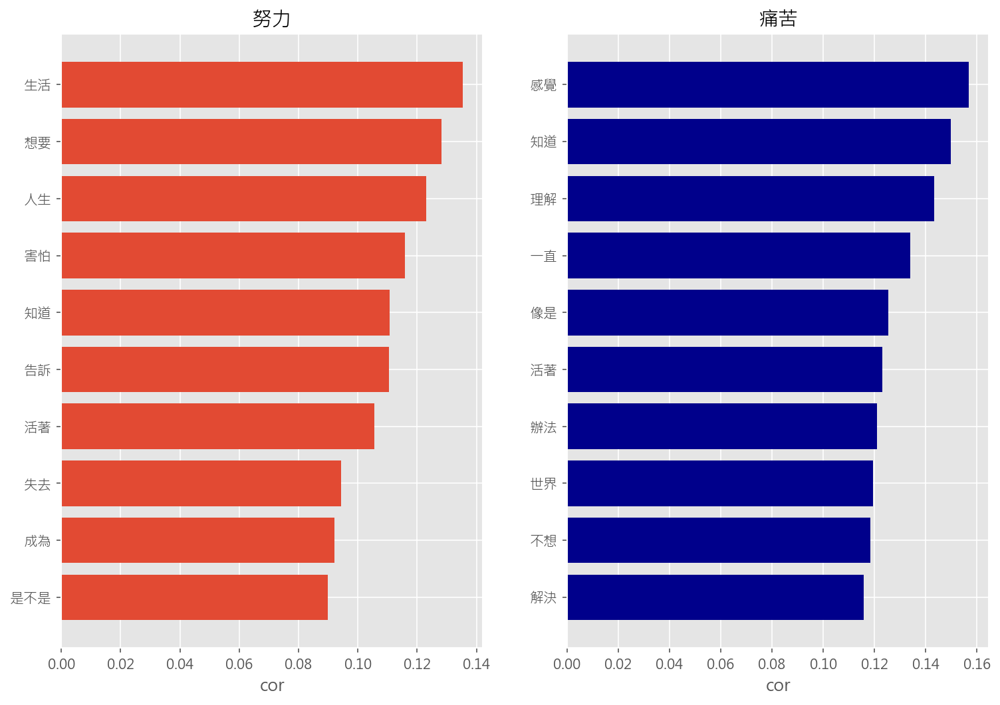

In [192]:
plt.figure(figsize=(12,8))   # 顯示圖框架大小 (寬,高)
plt.style.use("ggplot")     # 使用ggplot主題樣式

plt.subplot(121)
plt.title('努力')
plt.xlabel('cor')
plt.barh(effort_sum['word2'],effort_sum['cor'])
plt.gca().invert_yaxis()

plt.subplot(122)
plt.title('痛苦')
plt.xlabel('cor')
plt.barh(pain_sum['word2'],pain_sum['cor'],color="darkblue")
plt.gca().invert_yaxis()

plt.show()

``努力``可能和追求生活、害怕失去等等行為相關;``痛苦``感覺和心理狀態和周遭有關。

In [195]:
# 透過DTM找出詞頻前100高的詞彙
most_freq_df = DTM_df.sum().sort_values(ascending=False).head(100).reset_index().rename(columns={'index':'word', 0:'count'})

most_freq_word = most_freq_df['word'].tolist()

In [196]:
# 保留存在詞頻前60高之詞彙的組合
filtered_df = word_cor_df[(word_cor_df['word1'].isin(most_freq_word)) & (word_cor_df['word2'].isin(most_freq_word))]

# 篩選出相關係數大於0.2的組合
filtered_df = filtered_df[filtered_df['cor'] > 0.2]
filtered_df.reset_index(inplace=True, drop=True)
filtered_df.head(20)

,word1,word2,cor
0,時間,一天,0.255170
1,像是,一種,0.229391
2,時間,一種,0.250431
3,時間,事情,0.264398
4,朋友,人生,0.200518
5,根本,人生,0.216047
6,生活,人生,0.201259
7,一種,像是,0.229391
8,辦法,像是,0.200223
9,工作,公司,0.318672


In [197]:
# Create network plot 
g = nx.Graph()

# 建立 nodes 間的連結
for i in range(len(filtered_df)):
    g.add_edge(filtered_df["word1"][i], filtered_df["word2"][i], weight=filtered_df["cor"][i])
    
# 取得edge權重
weights = [w[2]['weight']*5 for w in  g.edges(data=True)]

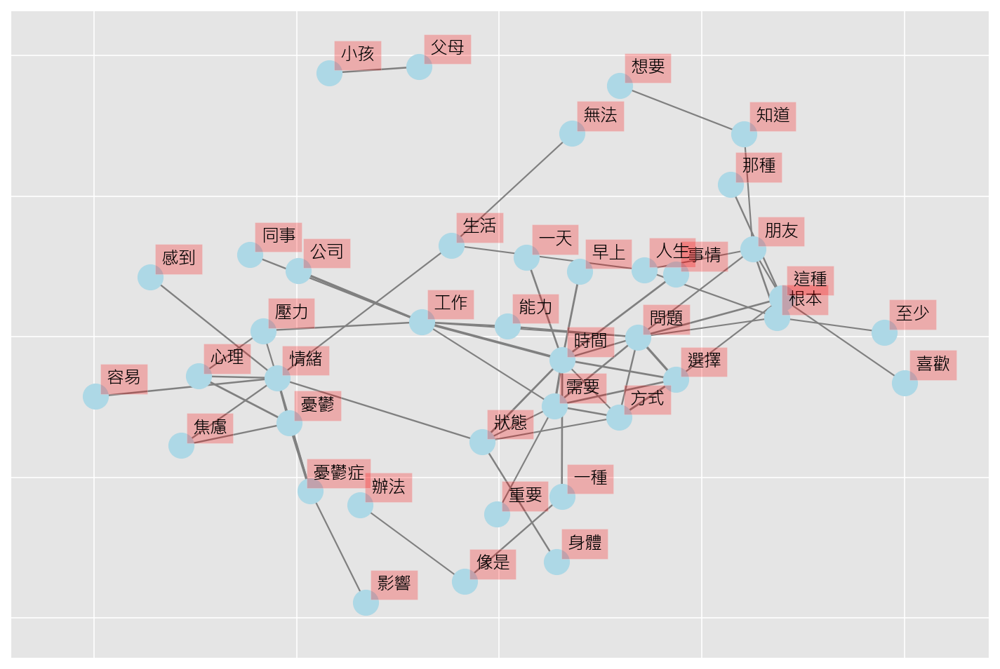

In [198]:
fig, ax = plt.subplots(figsize=(12, 8))

pos = nx.spring_layout(g, k=0.3)

# networks
nx.draw_networkx(g, pos,
                 font_size=16,
                 width=weights,
                 edge_color='grey',
                 node_color='lightblue',
                 with_labels = False,
                 ax=ax)

# 增加 labels
for key, value in pos.items():
    x, y = value[0]+.07, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=12)
    
plt.show()

可以看出較負面情緒的情緒詞彙會一起出現，而工作能力也是相關詞彙。可以看出整體詞彙可能圍繞在生活與職場相關的負面情緒中。

計算文章相似度 

In [199]:
data_cos = MetaData.copy()

data_cos['word'] = data_cos.sentence.apply(getToken).map(' '.join)

data_cos = data_cos.sample(frac=0.2, random_state=42)

data_cos.head(3)

,system_id,artUrl,artTitle,artDate,artContent,sentence,word
2195,2196,https://www.ptt.cc/bbs/prozac/M.1666853743.A.D...,[閒聊]告解,2022-10-27,告解\n\n我不是什麼好人，\n從來就不是，\n我脾氣很壞，是個非常兇的人，\n忍受不了遲到...,告解我不是什麼好人從來就不是我脾氣很壞是個非常兇的人忍受不了遲到這件事會非常火大我也受不了太...,告解 好人 我脾氣 忍受 遲到 這件 事會 火大 受不了 太笨 人會 耐心 善良 聖母 無條...
3054,3055,https://www.ptt.cc/bbs/prozac/M.1674311038.A.9...,[陰天]怪怪女,2023-01-21,一整天\n喝了540ml 威士忌\n帶著笑容\n讓身邊愛我的人快樂\n我卻在幽暗的公園\n哭...,一整天喝了威士忌帶著笑容讓身邊愛我的人快樂我卻在幽暗的公園哭得徹底不懂你為何突然消失不懂我從...,一整天 威士忌 帶著 笑容 身邊 愛我 快樂 幽暗 公園 徹底 突然 消失 不想 破壞 原有...
1604,1605,https://www.ptt.cc/bbs/prozac/M.1662796968.A.1...,[閒聊]fucking無聊,2022-09-10,Fucking無聊\n爆幹無聊的，空虛寂寞覺得冷了。\n本來想睡午覺補助，滾來滾去亢奮感讓人...,無聊爆幹無聊的空虛寂寞覺得冷了本來想睡午覺補助滾來滾去亢奮感讓人睡不著發了訊息呼叫久違的男生...,無聊 爆幹 無聊 空虛 寂寞 本來 午覺 補助 滾來 亢奮感 著發 訊息 呼叫 男生 朋友 ...


In [200]:
transformer = TfidfTransformer()  
print(transformer) 
# 將詞頻矩陣X統計成TF-IDF值
X = vectorizer.fit_transform(data_cos["word"])
tfidf = transformer.fit_transform(X)  

# 轉成dataframe
TFIDF_df = pd.DataFrame(columns = vocabulary, data = tfidf.toarray())
TFIDF_df

TfidfTransformer()


,一下,一件,一句,一堆,一天,一年,一次,一段,一直,一種,...,重新,重要,開心,關心,陪伴,離開,難過,需要,面對,黑暗
0,0.0,0.0,0.0,0.000000,0.0,0.00000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.00000,0.0
1,0.0,0.0,0.0,0.000000,0.0,0.00000,0.0,0.161822,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.203823,0.000000,0.0,0.00000,0.0
2,0.0,0.0,0.0,0.000000,0.0,0.00000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.00000,0.0
3,0.0,0.0,0.0,0.000000,0.0,0.00000,0.0,0.000000,0.227416,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.27239,0.0
4,0.0,0.0,0.0,0.000000,0.0,0.00000,0.0,0.125830,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.107599,0.0,0.00000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1490,0.0,0.0,0.0,0.106394,0.0,0.00000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.00000,0.0
1491,0.0,0.0,0.0,0.000000,0.0,0.00000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.00000,0.0
1492,0.0,0.0,0.0,0.000000,0.0,0.09007,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.00000,0.0
1493,0.0,0.0,0.0,0.000000,0.0,0.00000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.00000,0.0


In [201]:
cosine_matrix = cosine_similarity(tfidf.toarray(), tfidf.toarray())

> 檢查與第14篇相關的文章

In [202]:
cos_df = pd.DataFrame(cosine_matrix[14], columns = ['cos_similarity'])
cos_df

,cos_similarity
0,0.083162
1,0.105811
2,0.138122
3,0.050459
4,0.058570
...,...
1490,0.098249
1491,0.000000
1492,0.088295
1493,0.050285


In [203]:
cos_df = pd.DataFrame(cosine_matrix[14, :], columns=['cos_similarity'])
cos_df = cos_df.merge(data_cor, how='left', left_index=True, right_index=True)
cos_df.loc[:, ["cos_similarity", "artTitle", "artUrl"]].sort_values(by=['cos_similarity'], ascending=False).head(10)

,cos_similarity,artTitle,artUrl
14,1.000000,[閒聊]退步原來是向前,https://www.ptt.cc/bbs/prozac/M.1650463964.A.C...
1264,0.400058,[陰天]我很想放過自己,https://www.ptt.cc/bbs/prozac/M.1660379453.A.1...
1209,0.396868,[閒聊]還來,https://www.ptt.cc/bbs/prozac/M.1659853953.A.6...
355,0.391896,[陰天]遺囑,https://www.ptt.cc/bbs/prozac/M.1652945878.A.7...
1058,0.379982,[閒聊]詐騙集團,https://www.ptt.cc/bbs/prozac/M.1658655003.A.0...
56,0.379329,[陰天]互相傷害,https://www.ptt.cc/bbs/prozac/M.1650824223.A.9...
686,0.374546,[陰天]累,https://www.ptt.cc/bbs/prozac/M.1655841375.A.C...
983,0.374221,[陰天]工作真難找,https://www.ptt.cc/bbs/prozac/M.1658129877.A.6...
785,0.335137,[閒聊]失眠(七十三)身體有話要說,https://www.ptt.cc/bbs/prozac/M.1656629124.A.C...
474,0.330611,[陰天]每天是種練習,https://www.ptt.cc/bbs/prozac/M.1653950836.A.E...


In [205]:
cos_df_14 = pd.DataFrame(cosine_matrix[14], columns=['cos_similarity'])

cos_df_14 = cos_df_14.merge(data_cor, how = 'left', left_index=True, right_index=True)
cos_df_14.loc[:,["cos_similarity", "artTitle", "artUrl"]].sort_values(by=['cos_similarity'], ascending=False).head(10)

,cos_similarity,artTitle,artUrl
14,1.000000,[閒聊]退步原來是向前,https://www.ptt.cc/bbs/prozac/M.1650463964.A.C...
1264,0.400058,[陰天]我很想放過自己,https://www.ptt.cc/bbs/prozac/M.1660379453.A.1...
1209,0.396868,[閒聊]還來,https://www.ptt.cc/bbs/prozac/M.1659853953.A.6...
355,0.391896,[陰天]遺囑,https://www.ptt.cc/bbs/prozac/M.1652945878.A.7...
1058,0.379982,[閒聊]詐騙集團,https://www.ptt.cc/bbs/prozac/M.1658655003.A.0...
56,0.379329,[陰天]互相傷害,https://www.ptt.cc/bbs/prozac/M.1650824223.A.9...
686,0.374546,[陰天]累,https://www.ptt.cc/bbs/prozac/M.1655841375.A.C...
983,0.374221,[陰天]工作真難找,https://www.ptt.cc/bbs/prozac/M.1658129877.A.6...
785,0.335137,[閒聊]失眠(七十三)身體有話要說,https://www.ptt.cc/bbs/prozac/M.1656629124.A.C...
474,0.330611,[陰天]每天是種練習,https://www.ptt.cc/bbs/prozac/M.1653950836.A.E...


## 7. LDA 主題模型


產生dictionary和corpus

In [ ]:
docs = ppt['words'].to_list()
docs[0]

['今天',
 '疫苗',
 '順便',
 '問了',
 '醫生',
 '身體',
 '一直',
 '存在',
 '舒服',
 '症狀',
 '兩年',
 '檢查',
 '過沒',
 '診斷',
 '症狀',
 '一直',
 '存在',
 '感覺',
 '普通',
 '常見',
 '那種',
 '問了',
 '醫生',
 '兩年',
 '需要',
 '檢查',
 '醫生',
 '建議',
 '檢查',
 '東西',
 '成長性',
 '這句',
 '心情',
 '放心',
 '尋常',
 '身體',
 '症狀',
 '追究',
 '原因',
 '未知',
 '恐懼',
 '襲來']

In [ ]:
dictionary = Dictionary(docs)
# Filter out words that occur less than 5 documents, or more than 99% of the documents.
dictionary.filter_extremes(no_below=5, no_above=0.9)
print(dictionary)

2024-06-05 16:06:27,683 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2024-06-05 16:06:28,249 : INFO : built Dictionary<52638 unique tokens: ['一直', '今天', '兩年', '原因', '問了']...> from 7447 documents (total 480409 corpus positions)
2024-06-05 16:06:28,250 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<52638 unique tokens: ['一直', '今天', '兩年', '原因', '問了']...> from 7447 documents (total 480409 corpus positions)", 'datetime': '2024-06-05T16:06:28.250146', 'gensim': '4.3.1', 'python': '3.11.5 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:26:23) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.19045-SP0', 'event': 'created'}
2024-06-05 16:06:28,288 : INFO : discarding 41983 tokens: [('成長性', 2), ('追究', 4), ('想演', 1), ('致命傷', 2), ('針還', 1), ('滿懷', 1), ('詳述', 3), ('魚肚白', 1), ('一朝', 2), ('主盟', 1)]...
2024-06-05 16:06:28,289 : INFO : keeping 10655 tokens which were in no less than 5 and no more than 6702 (=90.0%) documents
2024-06-05 16:06:28,313 : INF

Dictionary<10655 unique tokens: ['一直', '今天', '兩年', '原因', '問了']...>


In [ ]:
for idx, (k, v) in enumerate(dictionary.token2id.items()):
    print(f"{k}: {v}")
    if idx > 10:
        break

一直: 0
今天: 1
兩年: 2
原因: 3
問了: 4
存在: 5
尋常: 6
常見: 7
建議: 8
心情: 9
恐懼: 10
感覺: 11


將斷詞結果建構語料庫(corpus)之後，利用語料庫把每篇文章數字化。<br>
每個詞彙都被賦予一個 ID 及頻率(word_id，word_frequency)。<br>

舉例來說：<br>
第一篇文章數字化結果為：corpus[600]:[(2, 2), (6, 1), (20, 2), .... ]，element 為文章中每個詞彙的 id 和頻率。<br>
代表：'世界'出現2次、'之戰'出現一次...以此類推

In [ ]:
pprint(" ".join(ppt['words'].iloc[600]))


'最近 垃圾 食物 每次 正常 食物 覺得 對不起 食物 垃圾 食物 覺得 心安理得 慢性 自殺'


In [ ]:
dictionary.doc2bow(ppt['words'].iloc[600])[:10]

[(106, 2),
 (136, 1),
 (201, 1),
 (204, 1),
 (362, 1),
 (383, 1),
 (2267, 4),
 (2317, 1),
 (4258, 2),
 (5571, 1)]

In [ ]:
# Bag-of-words representation of the documents.
# 用 gensim ldamodel input 需要將文章轉換成 bag of words 
corpus = [dictionary.doc2bow(doc) for doc in docs]

訓練 topic model

+ 參數說明：
    + corpus = 文檔語料庫
    + id2word = 詞彙字典
    + num_topics = 生成幾個主題數
    + random_state = 固定亂數值，每次的模型結果會一樣
    + iteration = 每個文章訓練的次數，可以設定高一點讓模型收斂
    + passes(epoch) = 整個 corpus 訓練模型的次數
    + alpha = 文章主題分佈
    + eta = 主題字分佈

模型參數沒有一個絕對的答案，同學們應該**使用相同的資料**，嘗試做參數上的調整，進而比較出較佳的模型結果。

In [ ]:
ldamodel = LdaModel(
    corpus=corpus, 
    id2word=dictionary, # 字典
    num_topics=3, # 生成幾個主題數
    random_state=4747, # 亂數
    iterations= 100
)

2024-06-05 16:47:14,739 : INFO : using symmetric alpha at 0.16666666666666666
2024-06-05 16:47:14,741 : INFO : using symmetric eta at 0.16666666666666666
2024-06-05 16:47:14,744 : INFO : using serial LDA version on this node
2024-06-05 16:47:14,753 : INFO : running online (single-pass) LDA training, 6 topics, 1 passes over the supplied corpus of 7447 documents, updating model once every 2000 documents, evaluating perplexity every 7447 documents, iterating 100x with a convergence threshold of 0.001000
2024-06-05 16:47:14,753 : WARNING : too few updates, training might not converge; consider increasing the number of passes or iterations to improve accuracy
2024-06-05 16:47:14,755 : INFO : PROGRESS: pass 0, at document #2000/7447
2024-06-05 16:47:16,588 : INFO : merging changes from 2000 documents into a model of 7447 documents
2024-06-05 16:47:16,592 : INFO : topic #4 (0.167): 0.017*"知道" + 0.010*"真的" + 0.008*"覺得" + 0.006*"現在" + 0.005*"一直" + 0.005*"好像" + 0.005*"感覺" + 0.005*"已經" + 0.004*"不

**2.2 查看 LDA 主題代表字** <br>

In [ ]:
ldamodel.print_topics(num_words=10)

2024-06-05 16:10:56,045 : INFO : topic #0 (0.167): 0.008*"知道" + 0.007*"真的" + 0.007*"世界" + 0.007*"喜歡" + 0.006*"像是" + 0.006*"希望" + 0.006*"覺得" + 0.006*"現在" + 0.005*"人生" + 0.005*"也許"
2024-06-05 16:10:56,046 : INFO : topic #1 (0.167): 0.012*"工作" + 0.011*"覺得" + 0.008*"問題" + 0.007*"真的" + 0.007*"現在" + 0.006*"已經" + 0.006*"知道" + 0.006*"比較" + 0.006*"朋友" + 0.005*"對方"
2024-06-05 16:10:56,047 : INFO : topic #2 (0.167): 0.019*"醫生" + 0.011*"真的" + 0.011*"一直" + 0.011*"知道" + 0.011*"痛苦" + 0.011*"覺得" + 0.010*"今天" + 0.007*"現在" + 0.007*"工作" + 0.006*"已經"
2024-06-05 16:10:56,049 : INFO : topic #3 (0.167): 0.010*"覺得" + 0.010*"真的" + 0.009*"知道" + 0.007*"現在" + 0.006*"感覺" + 0.005*"不想" + 0.005*"一直" + 0.005*"情緒" + 0.004*"焦慮" + 0.004*"事情"
2024-06-05 16:10:56,050 : INFO : topic #4 (0.167): 0.014*"知道" + 0.013*"真的" + 0.010*"今天" + 0.008*"覺得" + 0.007*"現在" + 0.006*"已經" + 0.006*"不想" + 0.006*"一下" + 0.006*"感覺" + 0.005*"好像"
2024-06-05 16:10:56,052 : INFO : topic #5 (0.167): 0.006*"覺得" + 0.005*"喜歡" + 0.005*"看到" + 0.005*"台灣" + 0.

[(0,
  '0.008*"知道" + 0.007*"真的" + 0.007*"世界" + 0.007*"喜歡" + 0.006*"像是" + 0.006*"希望" + 0.006*"覺得" + 0.006*"現在" + 0.005*"人生" + 0.005*"也許"'),
 (1,
  '0.012*"工作" + 0.011*"覺得" + 0.008*"問題" + 0.007*"真的" + 0.007*"現在" + 0.006*"已經" + 0.006*"知道" + 0.006*"比較" + 0.006*"朋友" + 0.005*"對方"'),
 (2,
  '0.019*"醫生" + 0.011*"真的" + 0.011*"一直" + 0.011*"知道" + 0.011*"痛苦" + 0.011*"覺得" + 0.010*"今天" + 0.007*"現在" + 0.007*"工作" + 0.006*"已經"'),
 (3,
  '0.010*"覺得" + 0.010*"真的" + 0.009*"知道" + 0.007*"現在" + 0.006*"感覺" + 0.005*"不想" + 0.005*"一直" + 0.005*"情緒" + 0.004*"焦慮" + 0.004*"事情"'),
 (4,
  '0.014*"知道" + 0.013*"真的" + 0.010*"今天" + 0.008*"覺得" + 0.007*"現在" + 0.006*"已經" + 0.006*"不想" + 0.006*"一下" + 0.006*"感覺" + 0.005*"好像"'),
 (5,
  '0.006*"覺得" + 0.005*"喜歡" + 0.005*"看到" + 0.005*"台灣" + 0.004*"真的" + 0.004*"今天" + 0.004*"情緒" + 0.004*"現在" + 0.003*"人類" + 0.003*"心情"')]

我們可以根據每個主題的詞彙分佈來猜測，該主題可能是有關什麼樣的議題：

**2.3 計算 LDA 模型指標**
+ **Pointwise Mutual Information (PMI)** : <br>
+ **perplexity** :<br>

In [ ]:
# perplexity
perplexity = ldamodel.log_perplexity(corpus)
perplexity

2024-06-05 16:49:17,284 : INFO : -8.261 per-word bound, 306.7 perplexity estimate based on a held-out corpus of 7447 documents with 412152 words


-8.260619354145005

In [ ]:
np.exp(-perplexity)

0.0

In [ ]:
# npmi
NPMI_model_lda = CoherenceModel(model=ldamodel, texts=docs, coherence='c_npmi')
NPMI_lda = NPMI_model_lda.get_coherence()
print('這個主題的 PMI score: ', NPMI_lda)

2024-06-05 16:11:54,452 : INFO : using ParallelWordOccurrenceAccumulator<processes=11, batch_size=64> to estimate probabilities from sliding windows
2024-06-05 16:12:07,087 : INFO : 1 batches submitted to accumulate stats from 64 documents (2549 virtual)
2024-06-05 16:12:07,088 : INFO : 2 batches submitted to accumulate stats from 128 documents (4241 virtual)
2024-06-05 16:12:07,090 : INFO : 3 batches submitted to accumulate stats from 192 documents (7207 virtual)
2024-06-05 16:12:07,093 : INFO : 4 batches submitted to accumulate stats from 256 documents (9550 virtual)
2024-06-05 16:12:07,096 : INFO : 5 batches submitted to accumulate stats from 320 documents (11654 virtual)
2024-06-05 16:12:07,099 : INFO : 6 batches submitted to accumulate stats from 384 documents (15039 virtual)
2024-06-05 16:12:07,102 : INFO : 7 batches submitted to accumulate stats from 448 documents (17088 virtual)
2024-06-05 16:12:07,105 : INFO : 8 batches submitted to accumulate stats from 512 documents (20661 v

這個主題的 PMI score:  0.001303370824448968


In [ ]:
NPMI_model_lda.get_coherence_per_topic()

[-8.152515666806242e-05,
 -0.0003315712312104145,
 0.015733159124321005,
 0.0055385853743478,
 0.00482316514039247,
 -0.01786158830448899]

**2.4 透過指標找出最佳主題數**

In [ ]:
t0 = time.time()

topic_num_list = np.arange(2, 10)
result = {"topic_num":[], "perplexity":[], "pmi":[]}
model_set = dict()


for topic_num in topic_num_list:
    # perplexity
    model = LdaModel(
        corpus = corpus,
        num_topics = topic_num ,
        id2word=dictionary,
        random_state = 42,
        iterations= 100,
        passes=5 # 訓練次數
        )
    
    loss = model.log_perplexity(corpus)
    pmi = CoherenceModel(model=model, texts=docs, coherence='c_npmi').get_coherence()
    perplexity = np.exp(-1. * loss)
    
    # model_set[f'k_{topic_num}'] = model
    
    result['topic_num'].append(topic_num)
    result['perplexity'].append(perplexity)
    result['pmi'].append(pmi)
    
print(f"花費時間: {time.time() - t0} sec")


2024-06-05 17:12:10,696 : INFO : using symmetric alpha at 0.5
2024-06-05 17:12:10,698 : INFO : using symmetric eta at 0.5
2024-06-05 17:12:10,701 : INFO : using serial LDA version on this node
2024-06-05 17:12:10,705 : INFO : running online (multi-pass) LDA training, 2 topics, 5 passes over the supplied corpus of 7447 documents, updating model once every 2000 documents, evaluating perplexity every 7447 documents, iterating 100x with a convergence threshold of 0.001000
2024-06-05 17:12:10,706 : INFO : PROGRESS: pass 0, at document #2000/7447
2024-06-05 17:12:12,950 : INFO : merging changes from 2000 documents into a model of 7447 documents
2024-06-05 17:12:12,954 : INFO : topic #0 (0.500): 0.010*"知道" + 0.010*"覺得" + 0.009*"真的" + 0.006*"工作" + 0.005*"醫生" + 0.005*"現在" + 0.005*"一直" + 0.005*"不想" + 0.005*"事情" + 0.004*"感覺"
2024-06-05 17:12:12,954 : INFO : topic #1 (0.500): 0.009*"知道" + 0.009*"覺得" + 0.009*"真的" + 0.008*"現在" + 0.006*"已經" + 0.006*"工作" + 0.005*"一直" + 0.005*"今天" + 0.005*"醫生" + 0.004*

花費時間: 360.2581412792206 sec


訓練要花一點時間，同學可以研究看看平行運算的 `gensim.models.ldamulticore.LdaMulticore()` class 或是其他方法

In [ ]:
result = pd.DataFrame(result)
result

,topic_num,perplexity,pmi
0,2,3224.049714,0.001468
1,3,3220.946987,0.003261
2,4,3319.426111,0.015382
3,5,3343.112078,0.002810
4,6,3419.218829,-0.033637
5,7,3515.921697,-0.012300
6,8,3566.027793,-0.004928
7,9,3627.860654,-0.003289


<Axes: xlabel='topic_num'>

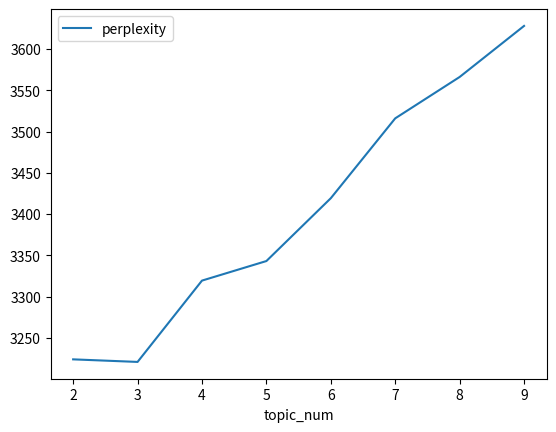

In [ ]:
result.plot.line(x='topic_num', y='perplexity')

<Axes: xlabel='topic_num'>

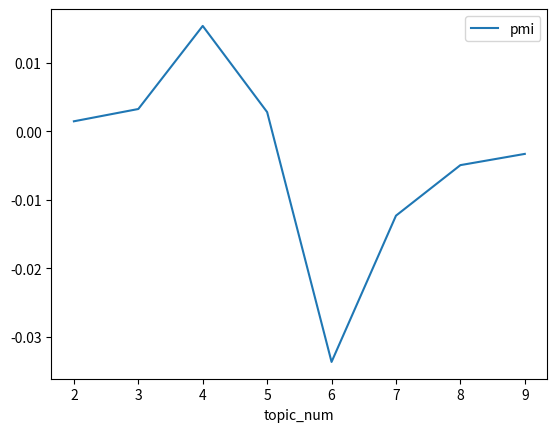

In [ ]:
result.plot.line(x='topic_num', y='pmi')

就訓練結果來看，perplexity 和 coherence 的表現最好是在3~5個主題數的時候

Perplexity隨著主題數增加而增加

Coherence的表現則是在主題數4時最高，6時達到最低

### 視覺化呈現

以下用主題數 4 來做 LDAvis

In [ ]:
best_model = LdaModel(
    corpus = corpus,
    num_topics = 3,
    id2word=dictionary,
    random_state = 42,
    iterations= 150,
    passes = 10 # 訓練次數
    )

2024-06-05 17:41:19,522 : INFO : using symmetric alpha at 0.3333333333333333
2024-06-05 17:41:19,524 : INFO : using symmetric eta at 0.3333333333333333
2024-06-05 17:41:19,527 : INFO : using serial LDA version on this node
2024-06-05 17:41:19,533 : INFO : running online (multi-pass) LDA training, 3 topics, 10 passes over the supplied corpus of 7447 documents, updating model once every 2000 documents, evaluating perplexity every 7447 documents, iterating 150x with a convergence threshold of 0.001000
2024-06-05 17:41:19,535 : INFO : PROGRESS: pass 0, at document #2000/7447
2024-06-05 17:41:23,129 : INFO : merging changes from 2000 documents into a model of 7447 documents
2024-06-05 17:41:23,133 : INFO : topic #0 (0.333): 0.010*"知道" + 0.009*"覺得" + 0.008*"真的" + 0.006*"工作" + 0.005*"不想" + 0.005*"醫生" + 0.005*"現在" + 0.005*"情緒" + 0.005*"一直" + 0.005*"感覺"
2024-06-05 17:41:23,135 : INFO : topic #1 (0.333): 0.009*"知道" + 0.008*"覺得" + 0.007*"現在" + 0.007*"已經" + 0.007*"真的" + 0.006*"今天" + 0.006*"工作" + 0

In [ ]:
pyLDAvis.enable_notebook()
p = pyLDAvis.gensim_models.prepare(best_model, corpus, dictionary)
p

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.010442 -0.126949       1        1  37.949369
1     -0.147522  0.056488       2        1  33.594800
0      0.137080  0.070461       3        1  28.455831, topic_info=    Term         Freq        Total Category  logprob  loglift
26    醫生  1886.000000  1886.000000  Default  30.0000  30.0000
177   工作  2024.000000  2024.000000  Default  29.0000  29.0000
1     今天  2036.000000  2036.000000  Default  28.0000  28.0000
315   世界  1123.000000  1123.000000  Default  27.0000  27.0000
510   上班   601.000000   601.000000  Default  26.0000  26.0000
..   ...          ...          ...      ...      ...      ...
496   這是   240.960085   614.817254   Topic3  -6.1877   0.3201
178   已經   314.888622  1869.607385   Topic3  -5.9201  -0.5244
633   每個   210.004146   430.206172   Topic3  -6.3252   0.5397
0     一直   270.245730  2171.149403   Topic3  -6.0730  -0.8269
191   情緒   249.744615  1332.838720   Topic3  -6.1519  -0.4178

[285 rows x 6 columns], token_table=      Topic      Freq Term
term                      
656       1  0.126004   一下
656       2  0.578764   一下
656       3  0.294721   一下
1031      1  0.046120  一個月
1031      2  0.942888  一個月
...     ...       ...  ...
3706      1  0.011586   風格
3706      3  0.984840   風格
1315      1  0.942314   黑暗
1315      2  0.039100   黑暗
1315      3  0.019550   黑暗

[500 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 2, 1])

主題數為3時，主題分類的表現還不錯，調整lambda來分析主題模型的結果。

主題1：當lambda=0.7時，可以看到主題的關鍵詞大多是情緒相關的詞語(例如:痛苦、努力、喜歡、恐懼、焦慮)和對於生活或體悟相關的詞語(例如：世界、人生、失眠、選擇、面對)<br>
這類主題的document或許多為抒發情緒為目的的文章，內容可能包含了個人感受和經歷、心理和身體的痛苦以及對生活的反思，文章的作者可能希望尋求一些生活上的共鳴和支持。

---
主題2：這一類的主題的詞彙主要和工作家庭(工作、家裡、上班、回家、老闆、公司)相關。<br>
這個主題的文章內容或許多為工作上的內容：包括工作壓力、與同事的互動內容，和上司的交涉情況；以及家庭生活的描述：包括日常生活的點滴、家庭情況以及個人感受，可以看出主題的關鍵詞多為和現實生活有關。

---
主題3：這類主題的詞彙和社會政治和社交相關(朋友、喜歡、對方、社會、有趣、新聞、以及國家名稱)。<br>
這個主題的文章內容也許和作者對國家政治的關注，以及對社交相關的體驗經驗，可能是作者對於外在環境的評論以及分享，也可能表達他對環境局勢的擔憂。

### 接著把主題數量改成6 看看LDA模型會怎麼分類主題

In [ ]:
model_4 = LdaModel(
    corpus = corpus,
    num_topics = 6,
    id2word=dictionary,
    random_state = 2024,
    iterations= 100,
    passes = 10 # 訓練次數
    )
pyLDAvis.enable_notebook()
p = pyLDAvis.gensim_models.prepare(model_4, corpus, dictionary)
p

2024-06-05 20:11:39,519 : INFO : using symmetric alpha at 0.16666666666666666
2024-06-05 20:11:39,521 : INFO : using symmetric eta at 0.16666666666666666
2024-06-05 20:11:39,526 : INFO : using serial LDA version on this node
2024-06-05 20:11:39,535 : INFO : running online (multi-pass) LDA training, 6 topics, 10 passes over the supplied corpus of 7447 documents, updating model once every 2000 documents, evaluating perplexity every 7447 documents, iterating 100x with a convergence threshold of 0.001000
2024-06-05 20:11:39,539 : INFO : PROGRESS: pass 0, at document #2000/7447
2024-06-05 20:11:42,020 : INFO : merging changes from 2000 documents into a model of 7447 documents
2024-06-05 20:11:42,025 : INFO : topic #4 (0.167): 0.010*"覺得" + 0.009*"知道" + 0.009*"醫生" + 0.007*"真的" + 0.006*"感覺" + 0.006*"痛苦" + 0.005*"時間" + 0.005*"工作" + 0.005*"現在" + 0.004*"已經"
2024-06-05 20:11:42,027 : INFO : topic #1 (0.167): 0.010*"知道" + 0.009*"覺得" + 0.009*"真的" + 0.008*"現在" + 0.006*"感覺" + 0.006*"工作" + 0.005*"醫生" +

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.092224 -0.051287       1        1  26.238537
1      0.095814  0.020846       2        1  19.285035
3     -0.003061 -0.069208       3        1  19.064286
5     -0.111689 -0.173964       4        1  15.980988
0     -0.218126  0.155770       5        1  10.236937
4      0.144839  0.117842       6        1   9.194217, topic_info=     Term         Freq        Total Category  logprob  loglift
26     醫生  1987.000000  1987.000000  Default  30.0000  30.0000
177    工作  2072.000000  2072.000000  Default  29.0000  29.0000
1      今天  2017.000000  2017.000000  Default  28.0000  28.0000
931    痛苦  1564.000000  1564.000000  Default  27.0000  27.0000
573    同事   605.000000   605.000000  Default  26.0000  26.0000
...   ...          ...          ...      ...      ...      ...
61     焦慮   131.165314   982.084587   Topic6  -5.6661   0.3734
1593   慢慢   103.161906   319.829245   Topic6  -5.9063   1.2551
472    無法   121.849017  1131.789377   Topic6  -5.7398   0.1578
719    精神   103.258984   335.204939   Topic6  -5.9053   1.2091
2290   快樂   107.773831   498.797748   Topic6  -5.8625   0.8544

[496 rows x 6 columns], token_table=      Topic      Freq Term
term                      
656       1  0.137688   一下
656       2  0.054435   一下
656       3  0.143025   一下
656       4  0.353293   一下
656       5  0.209201   一下
...     ...       ...  ...
1315      1  0.020236   黑暗
1315      2  0.768958   黑暗
1315      3  0.178074   黑暗
1315      5  0.012141   黑暗
1315      6  0.020236   黑暗

[1224 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 2, 4, 6, 1, 5])

分成六個主題後，有部分主題(主題1、2、3)出現了重疊的區域，代表這些主題有相似的部分。

---
主題1的關鍵字包括：朋友、社會、問題、根本、需要，其中「覺得」的詞頻佔據最高，這類主題的文章內容可能多為作者討論自己和交友圈對當下社會議題的看法。

主題2的關鍵字包括：世界、知道、人生、自我、努力、焦慮以及許多情緒詞語，其中也有「母親」、「父親」、「父母」，文章的內容可能和家庭方面的壓力宣洩，以及文章作者對自我人生的探討有關。

主題3的關鍵字包括：醫生、痛苦、吃藥、諮商、知道、回診，可以看得出這個主題和心理健康與醫療有關，這類的文章作者可能會分享一些生活中尋求心理諮詢協助的體驗和感受。

---
其他主題(主題4、5、6)就相對有唯一性，以下探討他們可能代表的文章主題和內容。

主題4的關鍵字包括：工作、同事、老闆、公司，這些字詞都和工作事業相關，可以得出這類主題可能和工作上的經歷，以及在職場上遇到的困難和壓力有關。

主題5的關鍵字包括：運動、洗澡、睡覺、早餐、影片，從這些詞語可以推測這個主題的內容與日常生活的活動和習慣有關，可能包含了作者的娛樂與放鬆、睡眠習慣的討論等。

主題6的關鍵字包括：憂鬱症、藥物、感覺、患者、治療，可以看出這個主題和憂鬱症的治療和症狀有關，內容推測包含了個人的感受經歷、治療過程以及對藥物的看法。

In [ ]:
pyLDAvis.save_html(p, "lda_zh_depression.html")

## 8. GuidedLDA

In [ ]:
import guidedlda

In [ ]:
vocab = tuple(dictionary.token2id.keys())
vocab[:10]

('一直', '今天', '兩年', '原因', '問了', '存在', '尋常', '常見', '建議', '心情')

In [ ]:
word2id = dictionary.token2id

挑選上面一些有興趣的主題，去給予LDA一些主題種子字：

1. 家庭與自我情感
2. 社會關係和個人看法
3. 心理健康和治療

In [ ]:
seed_topic_list = [
    ["世界", "人生", "父親", "母親", "自我", "努力"], # 家庭與自我情感
    ["朋友", "社會", "問題", "需要", "根本"], # 社會關係和個人看法
    ["憂鬱症", "藥物", "感覺", "治療", "患者"], # 心理健康和醫療 
]

In [ ]:
seed_topics = {}
for t_id, st in enumerate(seed_topic_list):
    for word in st:
        seed_topics[word2id[word]] = t_id

In [ ]:
# guidedlda 需要 DTM 格式作為 input，因此這邊利用 corpus2dense() 方法進行轉換
X = corpus2dense(corpus, len(dictionary), len(corpus)).T.astype(np.int64)

In [ ]:
model = guidedlda.GuidedLDA(n_topics=4, n_iter=100, random_state=42, refresh=20)
model.fit(X, seed_topics=seed_topics, seed_confidence=1)

2024-06-05 22:04:31,735 : INFO : n_documents: 7447
2024-06-05 22:04:31,737 : INFO : vocab_size: 10655
2024-06-05 22:04:31,737 : INFO : n_words: 412152
2024-06-05 22:04:31,739 : INFO : n_topics: 4
2024-06-05 22:04:31,740 : INFO : n_iter: 100
2024-06-05 22:04:31,856 : WARNING : all zero row in document-term matrix found
2024-06-05 22:04:36,381 : INFO : <0> log likelihood: -4138561
2024-06-05 22:04:36,881 : INFO : <20> log likelihood: -3597318
2024-06-05 22:04:37,398 : INFO : <40> log likelihood: -3551036
2024-06-05 22:04:38,000 : INFO : <60> log likelihood: -3532050
2024-06-05 22:04:38,570 : INFO : <80> log likelihood: -3522337
2024-06-05 22:04:39,079 : INFO : <99> log likelihood: -3516083


In [ ]:
# 整理／顯示主題模型結果
n_top_words = 10
topic_word = model.topic_word_

for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocab)[np.argsort(topic_dist)][: -(n_top_words + 1) : -1]
    print("Topic {}: {}".format(i, " ".join(topic_words)))
    

doc_topic = model.doc_topic_
term_freq = tuple(dictionary.cfs.values())
doc_len = [sum(v for k, v in doc) for doc in corpus]

## LDAvis
pyLDAvis.enable_notebook()
p = pyLDAvis.prepare(topic_word, doc_topic, doc_len, vocab = vocab, term_frequency = term_freq)
p

Topic 0: 知道 覺得 真的 世界 痛苦 情緒 現在 人生 感覺 一直
Topic 1: 覺得 問題 比較 朋友 喜歡 真的 現在 需要 對方 時間
Topic 2: 醫生 工作 真的 知道 覺得 一直 現在 今天 感覺 已經
Topic 3: 今天 真的 知道 現在 昨天 有點 一直 時間 覺得 東西


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.026110 -0.205508       1        1  36.173051
2     -0.099612 -0.028805       2        1  25.980199
1      0.260676  0.103503       3        1  21.701284
3     -0.187174  0.130810       4        1  16.145466, topic_info=    Term         Freq        Total Category  logprob  loglift
26    醫生  2012.000000  2012.000000  Default  30.0000  30.0000
1     今天  1996.000000  1996.000000  Default  29.0000  29.0000
177   工作  2228.000000  2228.000000  Default  28.0000  28.0000
315   世界  1072.000000  1072.000000  Default  27.0000  27.0000
931   痛苦  1460.000000  1460.000000  Default  26.0000  26.0000
..   ...          ...          ...      ...      ...      ...
106   覺得   368.502248  3969.027894   Topic4  -5.1962  -0.5533
152   事情   249.665990  1463.482069   Topic4  -5.5855   0.0551
179   希望   237.682502  1614.263457   Topic4  -5.6347  -0.0922
177   工作   237.682502  2228.473925   Topic4  -5.6347  -0.4146
595   喜歡   227.696262  1502.613018   Topic4  -5.6776  -0.0634

[358 rows x 6 columns], token_table=      Topic      Freq Term
term                      
656       1  0.126644   一下
656       2  0.357005   一下
656       3  0.132103   一下
656       4  0.385391   一下
117       1  0.251427   一定
...     ...       ...  ...
976       2  0.090967  馬拉松
976       4  0.909669  馬拉松
7737      4  0.999778   魔法
78        4  1.000447   鼻子
4454      4  0.999639   鼻涕

[608 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 3, 2, 4])

同樣從關鍵字去分析主題的內容

主題1：關鍵字有「世界」、「人生」、「努力」這些種子字以外，也包含了痛苦、情緒、面對，這類文章應該多為描述作者面對的情緒挑戰和應對的心得。

主題2：關鍵字有「醫生」、「憂鬱症」、「藥物」，這個主題是我們希望他產出的心理健康和治療方向的內容。

主題3：關鍵字有「問題」、「社會」、「需要」、「文化」，這個主題是我們想要引導的社會關係和個人看法的主題。

主題4：關鍵字有「洗澡」、「運動」、「天氣」、「睡眠」、「早餐」，這個主題並沒有我們給予的seedwords，可以推測主題的內容和生活的習慣以及日常有關。

從結論來看，seedword有成功引導LDA模型去產出我們感興趣的主題類型

### 接著來嘗試主題數量更多的設定(主題數6)

In [ ]:
seed_topics = {}
for t_id, st in enumerate(seed_topic_list):
    for word in st:
        seed_topics[word2id[word]] = t_id

In [ ]:
model = guidedlda.GuidedLDA(n_topics=6, n_iter=100, random_state=42, refresh=20)
model.fit(X, seed_topics=seed_topics, seed_confidence=2)

2024-06-05 22:52:56,061 : INFO : n_documents: 7447
2024-06-05 22:52:56,062 : INFO : vocab_size: 10655
2024-06-05 22:52:56,063 : INFO : n_words: 412152
2024-06-05 22:52:56,064 : INFO : n_topics: 6
2024-06-05 22:52:56,064 : INFO : n_iter: 100
2024-06-05 22:52:56,157 : WARNING : all zero row in document-term matrix found
2024-06-05 22:52:59,248 : INFO : <0> log likelihood: -4408824
2024-06-05 22:52:59,696 : INFO : <20> log likelihood: -3652844
2024-06-05 22:53:00,139 : INFO : <40> log likelihood: -3587841
2024-06-05 22:53:00,573 : INFO : <60> log likelihood: -3559444
2024-06-05 22:53:01,034 : INFO : <80> log likelihood: -3541503
2024-06-05 22:53:01,475 : INFO : <99> log likelihood: -3530684


In [ ]:
n_top_words = 10
topic_word = model.topic_word_

for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocab)[np.argsort(topic_dist)][: -(n_top_words + 1) : -1]
    print("Topic {}: {}".format(i, " ".join(topic_words)))
    

doc_topic = model.doc_topic_
term_freq = tuple(dictionary.cfs.values())
doc_len = [sum(v for k, v in doc) for doc in corpus]

## LDAvis
pyLDAvis.enable_notebook()
p = pyLDAvis.prepare(topic_word, doc_topic, doc_len, vocab = vocab, term_frequency = term_freq)
p

Topic 0: 知道 覺得 真的 世界 痛苦 人生 情緒 現在 無法 事情
Topic 1: 覺得 問題 比較 朋友 喜歡 真的 對方 需要 現在 知道
Topic 2: 醫生 真的 感覺 知道 覺得 一直 現在 今天 工作 痛苦
Topic 3: 工作 真的 醫生 今天 知道 覺得 老闆 現在 應該 同事
Topic 4: 看到 台灣 真的 這是 影片 人類 有點 洗澡 超級 喜歡
Topic 5: 真的 現在 知道 今天 覺得 一直 時間 睡眠 焦慮 不想


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.122231  0.042298       1        1  31.027587
1      0.138720  0.227176       2        1  18.935010
2      0.036787 -0.109256       3        1  17.217318
3      0.038281 -0.100376       4        1  14.587818
4     -0.314948  0.102367       5        1  10.781956
5     -0.021070 -0.162210       6        1   7.450312, topic_info=    Term         Freq        Total Category  logprob  loglift
26    醫生  2011.000000  2011.000000  Default  30.0000  30.0000
177   工作  2227.000000  2227.000000  Default  29.0000  29.0000
1     今天  1995.000000  1995.000000  Default  28.0000  28.0000
931   痛苦  1459.000000  1459.000000  Default  27.0000  27.0000
364   老闆   561.000000   561.000000  Default  26.0000  26.0000
..   ...          ...          ...      ...      ...      ...
152   事情   128.716815  1462.712397   Topic6  -5.4746   0.1665
798   發現   110.757721   758.796596   Topic6  -5.6249   0.6725
201   最近   108.762266   928.501119   Topic6  -5.6431   0.4525
178   已經   113.750903  1882.018812   Topic6  -5.5982  -0.2092
11    感覺   108.762266  1826.064362   Topic6  -5.6431  -0.2238

[521 rows x 6 columns], token_table=      Topic      Freq Term
term                      
656       1  0.063357   一下
656       2  0.125622   一下
656       3  0.217381   一下
656       4  0.310232   一下
656       5  0.187887   一下
...     ...       ...  ...
3262      6  0.997998   餵食
6153      4  0.998966   高鐵
4056      3  0.190620   鬧鐘
4056      6  0.810137   鬧鐘
7654      6  0.998531   鼻水

[1057 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6])

結果設定主題數為6的表現從視覺化來看並不好，主題3和主題4幾乎完全重疊了。

從關鍵字來看，主題3是工作和職業相關；主題4是心理治療和健康相關。
兩者的高頻關鍵詞都有「工作」、「感覺」、「知道」

## 9. 主題分佈的比例

我們從第一個主題數為3的LDA模型來看憂鬱版的文章分布情況，其中3個主題我們的推測如下

1. 個人情感與自我反思
2. 工作事業與心理健康
3. 社會關係與個人觀點

In [ ]:
# 取得每條新聞的主題分佈
topics_doc = best_model.get_document_topics(corpus)

In [ ]:
topics_doc[100]

[(0, 0.45634127), (1, 0.09650018), (2, 0.44715855)]

In [ ]:
m_theta = corpus2csc(topics_doc).T.toarray()
m_theta

array([[0.12006342, 0.74696642, 0.13297014],
       [0.43550962, 0.14493215, 0.4195582 ],
       [0.11993221, 0.86457795, 0.01548977],
       ...,
       [0.24710916, 0.30467963, 0.44821116],
       [0.73893207, 0.        , 0.25932136],
       [0.03208495, 0.937644  , 0.03027104]])

In [ ]:
ppt['topic_label'] = m_theta.argmax(axis=1) + 1

In [ ]:
ppt['topic_label'].value_counts()

topic_label
2    3667
3    2667
1    1113
Name: count, dtype: int64

In [ ]:
ppt['artDate'] = pd.to_datetime(ppt['artDate'])

In [ ]:
date_topic = ppt.groupby(ppt['artDate'].dt.date)['topic_label'].value_counts(normalize=True).unstack()
date_topic

topic_label,1,2,3
artDate,,,
2022-04-19,0.166667,0.500000,0.333333
2022-04-20,0.083333,0.583333,0.333333
2022-04-21,0.090909,0.727273,0.181818
2022-04-22,NaN,0.714286,0.285714
2022-04-23,0.100000,0.700000,0.200000
...,...,...,...
2024-04-11,0.285714,0.714286,NaN
2024-04-12,0.181818,0.636364,0.181818
2024-04-13,0.062500,0.625000,0.312500


In [ ]:
date_topic.reset_index(inplace=True)


In [ ]:
date_topic

topic_label,artDate,1,2,3
0,2022-04-19,0.166667,0.500000,0.333333
1,2022-04-20,0.083333,0.583333,0.333333
2,2022-04-21,0.090909,0.727273,0.181818
3,2022-04-22,NaN,0.714286,0.285714
4,2022-04-23,0.100000,0.700000,0.200000
...,...,...,...,...
702,2024-04-11,0.285714,0.714286,NaN
703,2024-04-12,0.181818,0.636364,0.181818
704,2024-04-13,0.062500,0.625000,0.312500
705,2024-04-14,0.333333,0.333333,0.333333


In [ ]:
date_topic['artDate'] = pd.to_datetime(date_topic['artDate'])

date_topic['year_month'] = date_topic['artDate'].dt.to_period('M')

date_topic = date_topic.drop(columns=['artDate'])
# 以年月做分組
month_topic = date_topic.groupby('year_month').mean()

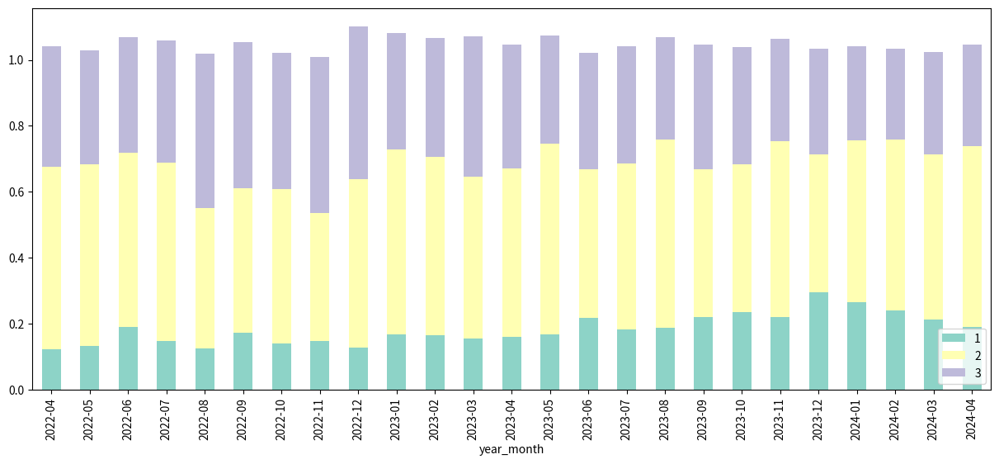

In [ ]:
fig, ax = plt.subplots(figsize=(15, 6))
month_topic.plot.bar(ax=ax, stacked=True, color = plt.cm.Set3.colors)
ax.legend(loc='lower right')

從主題分布來看，從上面LDAvis的比例推測，綠色主題應為「社會關係與個人觀點」，黃色主題占比最多，應為「個人情感與自我反思」。

可見憂鬱版的文章大多是分享個人在生活中的情緒和體悟，對多數發文者而言憂鬱版是用來宣洩心理壓力、尋求支持的地方。